# GooglePlay Applications Analysis


### By Adele Pia Romano & Salvatore Petrolo

# Setup

In [1]:
from __future__ import division, print_function, unicode_literals

import numpy as np

import os

import time
import datetime

import pickle

np.random.seed(13)

%matplotlib inline
import matplotlib as mpl

from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.base import BaseEstimator, TransformerMixin

from sklearn.model_selection import train_test_split

from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.multiclass import OneVsOneClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neural_network import MLPClassifier


from sklearn.preprocessing import label_binarize
from sklearn.preprocessing import KBinsDiscretizer

from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, precision_recall_curve, roc_curve, roc_auc_score

from imblearn.over_sampling import RandomOverSampler, SMOTE

import seaborn as sns
sns.set(style="whitegrid")

import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Paths
os.chdir("..\\")
PROJECT_ROOT_DIR = os.getcwd() 
DATASET_PATH = os.path.join(PROJECT_ROOT_DIR, "Datasets")
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "Img")
CHECKPOINT_PATH = os.path.join(PROJECT_ROOT_DIR, "Checkpoints")

import warnings
warnings.filterwarnings(action="ignore", message="^internal gelsd")

In [2]:
to_remove = []

def mark_as_to_remove(column):
    to_remove.append(column)

def save_checkpoint(classifier, filename):
    path = os.path.join(CHECKPOINT_PATH, filename)
    pickle.dump(classifier, open(path, 'wb'))

def load_checkpoint(filename): 
    path = os.path.join(CHECKPOINT_PATH, filename)
    return pickle.load(open(path, 'rb'))

def checkpoint_exists(filename):
    path = os.path.join(CHECKPOINT_PATH, filename)
    return os.path.isfile(path)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

def print_metrics(y_true, y_predicted):
    print("Accuracy:", accuracy_score(y_true, y_predicted, normalize=True), '\n')
    print("Precision:", precision_score(y_true, y_predicted, average='weighted', zero_division=1), '\n') #samples
    print("Recall:", recall_score(y_true, y_predicted, average='weighted', zero_division=1), '\n')
    print("F1-Score:", f1_score(y_true, y_predicted, average='weighted', zero_division=1))

def get_metrics(y_true, y_predicted):
    return accuracy_score(y_true, y_predicted, normalize=True),precision_score(y_true, y_predicted, average='weighted', zero_division=1), recall_score(y_true, y_predicted, average='weighted', zero_division=1), f1_score(y_true, y_predicted, average='weighted', zero_division=1)

class DiscreteTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, column, bins):
        self.column = column
        self.bins = bins
        pass

    def rename(self, encoded):
        dictionary = dict()
        for col in encoded.columns:
            dictionary[col] = self.column + '_' + str(col)
        encoded.rename(columns=dictionary, inplace=True)

    def get_bin_edges(self):
        return self.discretizer.bin_edges_

    def get_bins_dict(self):
        bins_dict = dict()
        bins = self.discretizer.bin_edges_[0]
        for i in range(bins.size-1):
            key = self.column + "_" + str(i)
            value = "[{:.3f},{:.3f})".format(bins[i], bins[i+1])
            bins_dict[key] = value
        return bins_dict

    def fit(self, dataframe, y=None):
        return self
    
    def transform(self, dataframe, y=None):
        self.discretizer = KBinsDiscretizer(n_bins=self.bins, encode='onehot-dense', strategy='uniform')
        encoded = self.discretizer.fit_transform(dataframe[[self.column]])
        df = pd.DataFrame(encoded, index=dataframe.index)
        self.rename(df)
        return dataframe.join(df)

# Caricamento Dati

In [3]:
import pandas as pd

def load_dataset(dataset_name):
    csv_path = os.path.join(DATASET_PATH, dataset_name)
    return pd.read_csv(csv_path)

In [4]:
data = load_dataset("googleplaystore.csv")

# Analisi dei Dati


In [5]:
data.head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,"5,000,000+",Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,"50,000,000+",Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,"100,000+",Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10841 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             10841 non-null  object 
 1   Category        10841 non-null  object 
 2   Rating          9367 non-null   float64
 3   Reviews         10841 non-null  object 
 4   Size            10841 non-null  object 
 5   Installs        10841 non-null  object 
 6   Type            10840 non-null  object 
 7   Price           10841 non-null  object 
 8   Content Rating  10840 non-null  object 
 9   Genres          10841 non-null  object 
 10  Last Updated    10841 non-null  object 
 11  Current Ver     10833 non-null  object 
 12  Android Ver     10838 non-null  object 
dtypes: float64(1), object(12)
memory usage: 1.1+ MB


Analizzando il risulato della funzione head(), ci si aspetterebbe che l'attributo Reviews sia di tipo intero, ma dall'output della funzione info() appare "object".

Indaghiamo meglio questo aspetto. 

In [7]:
data.Reviews.unique()[ : 100]

array(['159', '967', '87510', '215644', '167', '178', '36815', '13791',
       '121', '13880', '8788', '44829', '4326', '1518', '55', '3632',
       '27', '194216', '224399', '450', '654', '7699', '61', '118', '192',
       '20260', '203', '136', '223', '1120', '227', '5035', '1015', '353',
       '564', '8145', '36639', '158', '591', '117', '176', '295221',
       '2206', '26', '174531', '1070', '85', '845', '367', '1598', '284',
       '17057', '129', '542', '10479', '805', '1403', '3971', '534',
       '7774', '38846', '2431', '6090', '295', '190', '40211', '356',
       '52530', '116986', '1379', '271920', '736', '7021', '197', '737',
       '3574', '994', '197136', '142', '15168', '2155', '138', '5414',
       '21777', '348', '250', '13372', '7880', '3617', '4806', '65786',
       '31433', '5097', '1754', '2680', '1288', '18900', '49790', '1150',
       '1739'], dtype=object)

Possiamo notare come di fatto, Reviews sia effettivante un tipo intero, ma memorizzato come stringa.

Sarà quindi semplimente trasformato in fase di preprocessing.

Lo stesso discorso si può fare con l'attributo "Price". La funzione head() riporta però solo app il cui Type è "Free" aventi "Price" = 0. Vediamo cosa contengo le tuple aventi come Type "Paid".

In [8]:
data[data.Type == "Paid"].head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
234,TurboScan: scan documents and receipts in PDF,BUSINESS,4.7,11442,6.8M,"100,000+",Paid,$4.99,Everyone,Business,"March 25, 2018",1.5.2,4.0 and up
235,Tiny Scanner Pro: PDF Doc Scan,BUSINESS,4.8,10295,39M,"100,000+",Paid,$4.99,Everyone,Business,"April 11, 2017",3.4.6,3.0 and up
290,TurboScan: scan documents and receipts in PDF,BUSINESS,4.7,11442,6.8M,"100,000+",Paid,$4.99,Everyone,Business,"March 25, 2018",1.5.2,4.0 and up
291,Tiny Scanner Pro: PDF Doc Scan,BUSINESS,4.8,10295,39M,"100,000+",Paid,$4.99,Everyone,Business,"April 11, 2017",3.4.6,3.0 and up
427,Puffin Browser Pro,COMMUNICATION,4.0,18247,Varies with device,"100,000+",Paid,$3.99,Everyone,Communication,"July 5, 2018",7.5.3.20547,4.1 and up


Dall'output precedente, si nota come le app a pagamento presentano nella colonna Price il carattere '$' che precede un numero in virgola mobile che rappresenta il prezzo.


## Descrizione Attributi

App: è il nome dell'applicazione e risulta essere l'attributo identificante. 
     Si tratta di una stringa alfanumerica la quale include anche altri caratteri tra cui i segni di punteggiatura;

Category: rappresenta la categoria di appartenenza dell'app. E' rappresentato da una stringa e si tratta di un attributo nominale.
          Nel corso dell'analisi, tale attributo sarà più approfonditamente studiato e opportunamente trasformato;

Rating: come si può evincere dall'output della funzione info(), è l'unico attributo di tipo numerico, in particolare float, e rappresenta il punteggio dato
        dalla media delle recensioni dei singoli utenti.
        Inoltre, è possibile notare che è l'attributo che riporta in assoluto più elementi null (1474 valori non specificati). Sarà quindi necessario, definire una strategia
        con cui mitigare questa problematica che risulta accentuato dal fatto che si tratta dell'attributo di classe. 
        La classificazione delle app avverrà in base al valore di rating arrotondato (avremo le classi 1, 2, 3, 4, 5 stelle);

Reviews: rappresenza il numero di recensioni rilasciate all'applicazione;

Size: esprime la dimensione dell'applicazione;    

Installs: riporta il numero di installazioni, non in maniera esatta ma secondo dei range definiti da Google e che saranno di seguito meglio analizzati;

Type: è un attributo binario che assume valori "Free" o "Paid", indica quindi se l'applicazione è a pagamento o meno.
      Analizzando l'output della funzione head() si può notare come i valori di tale attributo siano ricavabili da quelli dell'attributo "Price", in particolare,le app "Free"                risultano avere Price = 0 mentre a quelle "Paid" corrisponde un valore > 0. Tale attributo potrebbe quindi essere rimosso;

Price: indica il prezzo, in dollari, dell'applicazione. Come precedentemente visto, il formato della colonna è il seguente: \$x con x valore float (o 0 in caso di app "Free").
Al fine di rendere l'attributo numerico, sarà eliminato il '$' e castizzato a float il valore numerico;

Content Rating: definisce il target di utenza consigliato per l'utilizzo dell'app. E' un attributo di tipo stringa conforme alle specifiche di Google che da un primo sguardo potrebbe                  essere convertito in un valore numerico assegnando ad ogni alternativa un numero distinto oppure applicandovi un OneHotEncoding;

Genres: riporta una lista di generi separati da ';'. Sembrerebbe esserci un legame tra gli attributi "Genres" e "Category" che sarà di seguito approfondito;

Last Updated: corrisponde alla data dell'ultimo aggiornamento rilasciato per l'app. Il formato è il seguente: MESE GIORNO, ANNO dove MESE è il nome del mese scritto per esteso, GIORNO               e ANNO sono due interi (es. March 13, 2019).
              Siamo indotti a pensare che app con "Last Updated" risalente a molto tempo fa, possano avere un basso valore di "Rating" dovuto per esempio a scarsa compatibilità con le               nuove versioni di Android che causa malcontento tra gli utenti. Successivamnte ci preoccuperemo di verificare la validità di tale ipotesi;

Current Ver: specifica la versione corrente dell'applicazione ed è una stringa;

Android Ver: indica la minima versione di Android richiesta al fine di poter scaricaricare ed utilizzare l'app.
             Da questo tributo, estraiamo due considerazioni: la prima è che meno una versione richiesta è recente, maggiore è il target d'utenza e potenzialmente potrebbero esserci                un maggior numero di Reviews; la seconda è che versione più obsolete unite ad un "Last Updated" poco recente potrebbe corrispondere ad un "Rating" basso.


# Valori Mancanti

Dalla funzione info() otteniamo le seguenti informazioni:

In [9]:
missing_values = pd.DataFrame(columns=['Attribute', '# Missing Values'])
missing_values.loc[0] = ['Rating', 1474]
missing_values.loc[1] = ['Type', 1]
missing_values.loc[2] = ['Content Rating', 1]
missing_values.loc[3] = ['Current Ver', 8]
missing_values.loc[4] = ['Android Ver', 3]
missing_values

,Attribute,# Missing Values
0,Rating,1474
1,Type,1
2,Content Rating,1
3,Current Ver,8
4,Android Ver,3


Al fine di gestire questa problematica, possiamo adottare una delle seguenti alternative:  
1. Se il dataset contiene un numero elevato di record, è possibile eliminare i record con attributi null;  
2. Ignorare tali valori mancanti;  
3. Compilare manualmente i valori mancanti (non praticabile con dataset con un elevato numero di record);  
4. Compilare automaticamnte i valori mancanti (es. usare la media, la mediana ecc).   

Nel presente lavoro, verranno utilizzati due diversi approcci: uno per l'attributo "Rating" ed un altro per i restanti attributi di cui sopra.

# Preprocessing

## App

Verifiamo prima di tutto se vi sono più app con lo stesso nome: in tal caso le righe duplicate saranno eliminate.

In [10]:
data.App.size

10841

In [11]:
data.App.unique().size

9660

Vediamo che sono presenti 1181 elementi duplicati, procediamo alla rimozione mantenendo il primo campione trovato.

In [12]:
data.drop_duplicates(subset='App', inplace=True, keep='first')

In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9660 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             9660 non-null   object 
 1   Category        9660 non-null   object 
 2   Rating          8197 non-null   float64
 3   Reviews         9660 non-null   object 
 4   Size            9660 non-null   object 
 5   Installs        9660 non-null   object 
 6   Type            9659 non-null   object 
 7   Price           9660 non-null   object 
 8   Content Rating  9659 non-null   object 
 9   Genres          9660 non-null   object 
 10  Last Updated    9660 non-null   object 
 11  Current Ver     9652 non-null   object 
 12  Android Ver     9657 non-null   object 
dtypes: float64(1), object(12)
memory usage: 1.0+ MB


## Category

Saving figure app4Category


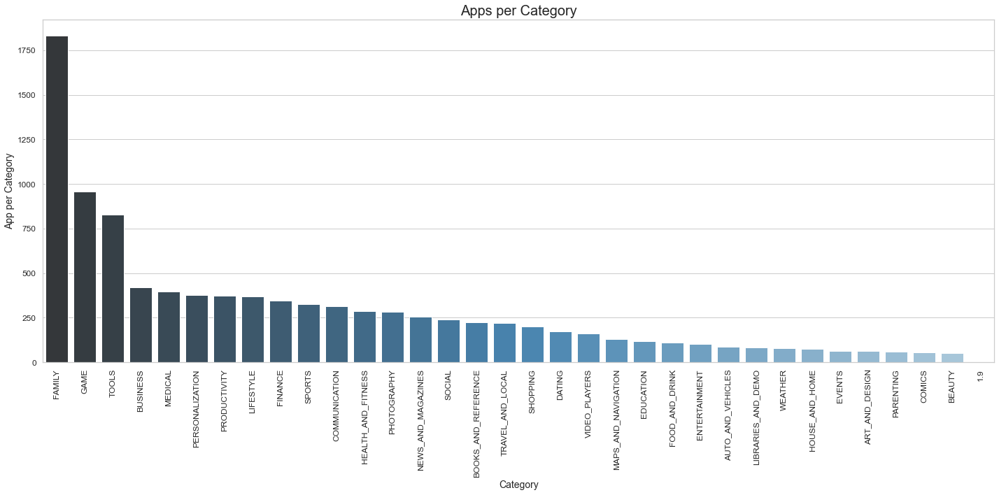

In [14]:
plt.figure(figsize=(20,10))
sns.barplot(x=data['Category'].value_counts().index, y=data['Category'].value_counts(),palette='Blues_d')
plt.ylabel("App per Category")
plt.xlabel("Category")
plt.title("Apps per Category",size = 20)
plt.xticks(rotation=90)
save_fig("app4Category")

Dal grafico si possono evincere due informazioni principali: la prima è che la maggior parte delle app ricade nella categoria "family", la seconda è che la categoria "1.9" è potenzialmente anomala.

Analizzaiamo le tuple in la cui categoria risulta "1.9"

In [15]:
data.Category[data.Category == '1.9'].index

Int64Index([10472], dtype='int64')

Notiamo che si tratta di un'unica tupla, di indice 10472, procediamo ad analizzarla.

In [16]:
data.loc[10472]

App               Life Made WI-Fi Touchscreen Photo Frame
Category                                              1.9
Rating                                                 19
Reviews                                              3.0M
Size                                               1,000+
Installs                                             Free
Type                                                    0
Price                                            Everyone
Content Rating                                        NaN
Genres                                  February 11, 2018
Last Updated                                       1.0.19
Current Ver                                    4.0 and up
Android Ver                                           NaN
Name: 10472, dtype: object

E' possibile notare che la riga di indice 10472 presenta del rumore. 
L'inserimento di tali valori sulla Google Play Developer Platform è un'operazione manuale, di conseguenza può essere soggetta ad errori. E' stata inserita in maniera scorretta:  questa tupla ne è un esempio.
In questo particolare caso, l'errore risulta essere che gli attributi siano stati inseriti in ordine errato, cioè risulta mancante l'attributo category e tutti gli altri valori inseriti sono traslati indietro di una colonna rispetto alle altre tuple.

Prima di procedere eliminiamo la riga di indice 10472 così da avere un'analisi migliore dei vari attributi:

In [17]:
data.drop(index=10472, inplace=True)

Procediamo con la trasformazione di tale attributo categorico utilizzando un OneHotEncoder, che ci permette di creare per ogni valore assunto dall'attributo una colonna nel dataset. Tali colonne verranno rinominate come "NomeAttributo_Valore". Per evitare di fare manualmente questa seconda operazione si utilizza la funzione di pandas "get_dummies()".

In [18]:
data = pd.concat([data, pd.get_dummies(data.Category, prefix="CAT")], axis = 1)
mark_as_to_remove("Category")

## Rating
  
Come precedentemente affermato, "Rating" è l'attributo di classe del nostro dataset. E' memorizzato come un float che rappresenta la media di tutti i punteggi dati dagli utilizzatori. Per la nostra analisi però è necessario ricondurli a valori interi. Prima però dobbiamo sostituire i valori mancanti nella colonna.

Prima di procedere con le varie modifiche verifichiamo se si tratta di un dataset sbilanciato graficando il numero di record per ogni valore di Rating e poi la distribuzione di tali valori.

Saving figure app4Rating


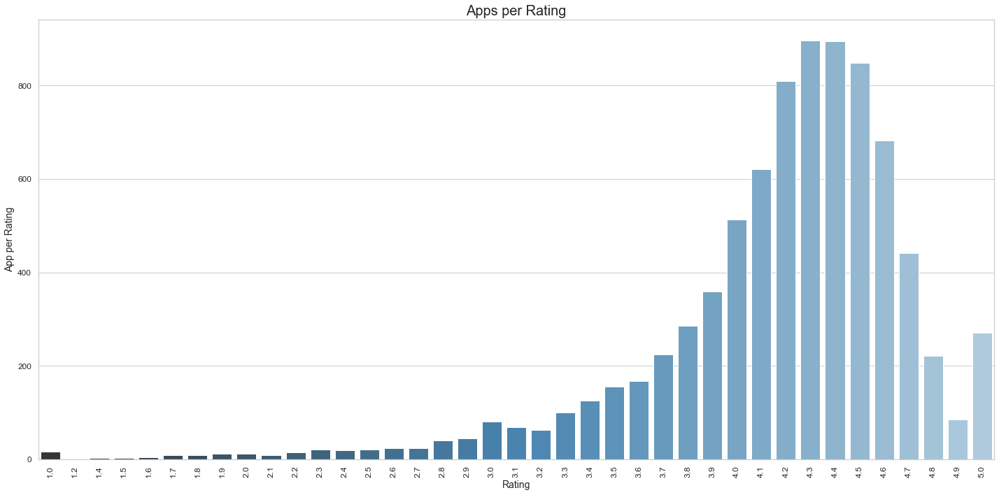

In [19]:
plt.figure(figsize=(20,10))
sns.barplot(x=data['Rating'].value_counts().index, y=data['Rating'].value_counts(),palette='Blues_d')
plt.ylabel("App per Rating")
plt.xlabel("Rating")
plt.title("Apps per Rating",size = 20)
plt.xticks(rotation=90)
save_fig("app4Rating")

Saving figure RatingDistribution


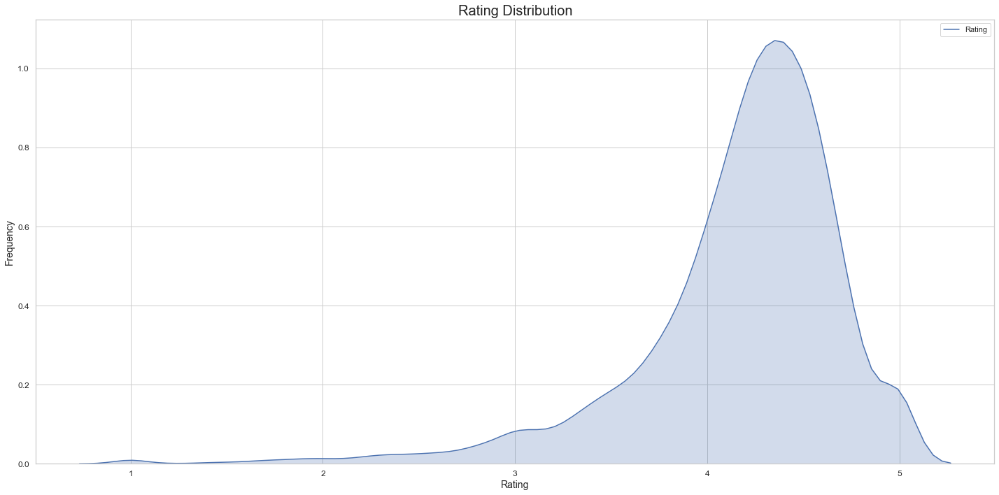

In [20]:
plt.figure(figsize=(20,10))
sns.kdeplot(data.Rating, color="b", shade = True)
plt.xlabel("Rating")
plt.ylabel("Frequency")
plt.title('Rating Distribution',size = 20)
save_fig("RatingDistribution")

Quello che si evince è certamente che il dataset è fortemente sbilanciato: in particolare i valori tra 4 e 5 risultano essere molto frequenti mentre quelli da 1 a 3 sono notevolmente più rari.

Per quanto riguarda la sostituzione dei NaN, utilizziamo un SimpleImputer che sostituisca tali valori con la media della colonna (non sarà quindi necessario settare l'attributo "strategy" che di default è mean).  
Dopodiche arrotonderemo i valori float ad int.

In [21]:
rating_imputer = SimpleImputer()
data.Rating = rating_imputer.fit_transform(data[["Rating"]])
data.Rating = data.Rating.round().astype(int)

Verifichiamo come è cambiata ora la distribuzione dei dati dopo gli aggiustamenti apportati:

Saving figure app4Rating


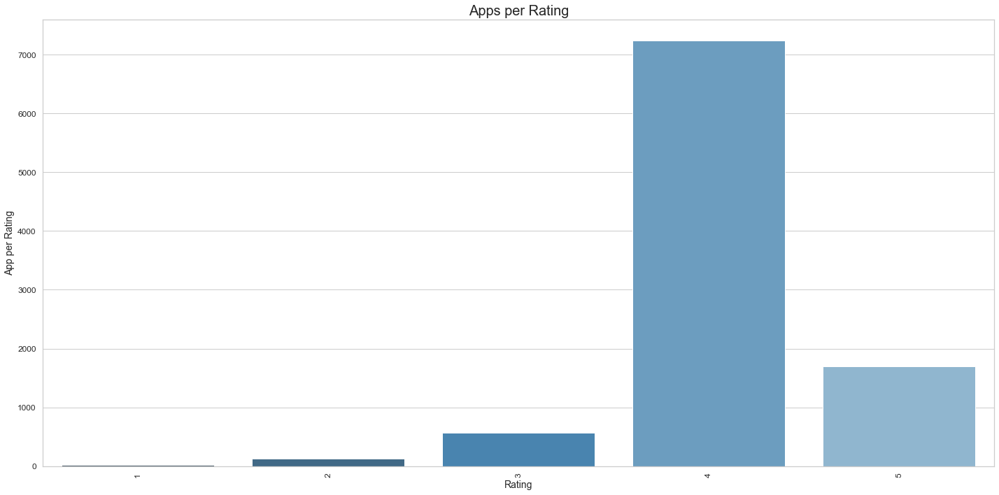

In [22]:
plt.figure(figsize=(20,10))
sns.barplot(x=data['Rating'].value_counts().index, y=data['Rating'].value_counts(),palette='Blues_d')
plt.ylabel("App per Rating")
plt.xlabel("Rating")
plt.title("Apps per Rating",size = 20)
plt.xticks(rotation=90)
save_fig("app4Rating")

Il grafico appena plottato conferma l'ipotesi sullo sbilanciamento del dataset: con maggiore precisione si può affermare che la classe 4 è la prevalente, mentre la 1 è la più rara.
Tale informazione ci è molto utile essendo "Rating" l'atributo di classe e dovremo tenerne conto in fase di classificazione.

## Reviews

Tale attributo rappresenta il numero di recensioni dell'app e abbiamo visto essere una colonna di valori numerici memorizzati però come stringhe.  
Ai fini della nostra analisi, sarà necessario semplicemente castizzare i valori ad int.

In [23]:
data.Reviews = data.Reviews.astype(int)
print(data.Reviews.head())

0       159
1       967
2     87510
3    215644
4       967
Name: Reviews, dtype: int32


## Size

Analizzaiamo i valori presenti in questa colonna:

In [24]:
data.Size.unique()[20 : 100]

array(['7.0M', '23M', '6.0M', '6.1M', '4.6M', '9.2M', '5.2M', '11M',
       '24M', 'Varies with device', '9.4M', '15M', '10M', '1.2M', '26M',
       '8.0M', '7.9M', '56M', '57M', '35M', '54M', '201k', '3.6M', '5.7M',
       '8.6M', '2.4M', '27M', '2.5M', '16M', '3.4M', '8.9M', '3.9M',
       '2.9M', '38M', '32M', '5.4M', '18M', '1.1M', '2.2M', '4.5M',
       '9.8M', '52M', '9.0M', '6.7M', '30M', '2.6M', '7.1M', '3.7M',
       '22M', '7.4M', '6.4M', '3.2M', '8.2M', '9.9M', '4.9M', '9.5M',
       '5.0M', '5.9M', '13M', '73M', '6.8M', '3.5M', '4.0M', '2.3M',
       '7.2M', '2.1M', '42M', '7.3M', '9.1M', '55M', '23k', '6.5M',
       '1.5M', '7.5M', '51M', '41M', '48M', '8.5M', '46M', '8.3M'],
      dtype=object)

Da un'analisi visiva di tutti i valori dell'attributo "Size" è stato possibile notare che sono presenti tre tipologie di valori (come si può vedere anche dal campione estrapolato).
La strategia utilizzata per uniformare i valori, ed in seguito renderli numerici, prevede:    

1. per i volori xK sarà rimossa il carattere 'K' e il valore sarà convertito in megabyte e poi in float;  

2. gli elementi che terminano con il carattere 'M' saranno banalmente privati di tale carattere e convertiti in float; 
 
3. infine ai volori 'Varies with device' sarà assegnato il valore medio della colonna calcolato ignorando le tuple con tale valore. Tale scelta è stata presa in quanto assegnare un valore preciso (per esempio 0) per sostituire la stringa 'Varies with device' poteva portare ad errori con l'applicazione dell'algoritmo di ML (soprattutto perche le tuple di interesse sono all'incirca un migliaio). 

In [25]:
k_indices = data['Size'].loc[data['Size'].str.contains('k')].index.tolist()
converter = pd.DataFrame(data.loc[k_indices, 'Size'].apply(lambda x: x.strip('k')).astype(float).apply(lambda x: x / 1024).apply(lambda x: round(x, 3)).astype(str))
data.loc[k_indices,'Size'] = converter

In [26]:
data['Size'] = data['Size'].apply(lambda x: x.strip('M'))

In [27]:
data_useful_for_mean = data[data.Size != 'Varies with device'].Size
data_useful_for_mean = data_useful_for_mean.astype(float)

mean = data_useful_for_mean.mean()

In [28]:
data.Size[data['Size'] == 'Varies with device'] = mean

In [29]:
data['Size'] = data['Size'].astype(float)

In [30]:
print(data.Size.head(188))

0      19.000000
1      14.000000
2       8.700000
3      25.000000
4       2.800000
         ...    
183     2.100000
184    42.000000
185     7.300000
186    30.000000
187    20.394896
Name: Size, Length: 188, dtype: float64


Saving figure SizeDistribution


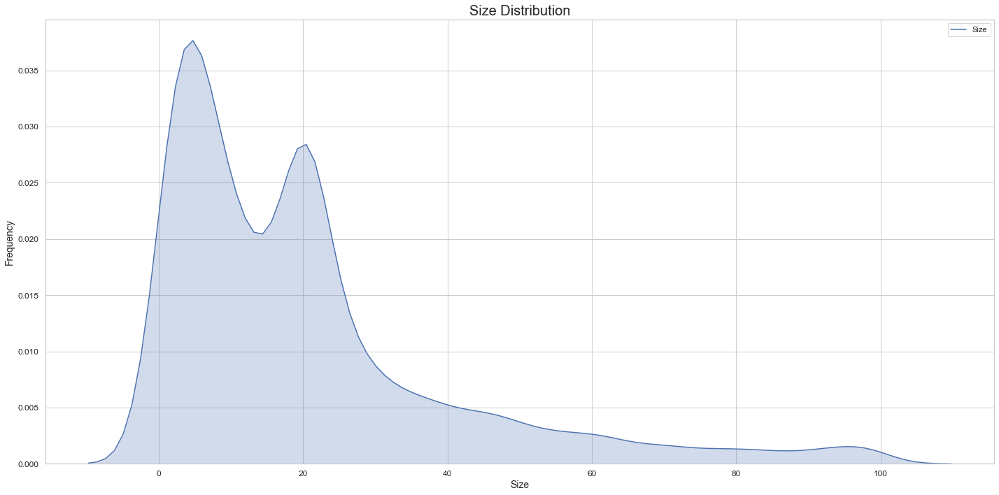

In [31]:
plt.figure(figsize=(20,10))
sns.kdeplot(data.Size, color="b", shade = True)
plt.xlabel("Size")
plt.ylabel("Frequency")
plt.title('Size Distribution', size = 20)
save_fig("SizeDistribution")

In [32]:
size_tranformer = DiscreteTransformer('Size', 5)
data = size_tranformer.fit_transform(data)
mark_as_to_remove("Size")

Dopo aver trasformato i valori di Size in interi, è stato deciso di discretizzare tale attributo al fine di ottenere una migliore analisi.   
I range ottenuti sono di seguito riportati:

In [33]:
pd.DataFrame.from_dict(data=size_tranformer.get_bins_dict(), orient='index', columns=['Range'])

,Range
Size_0,"[0.008,20.006)"
Size_1,"[20.006,40.005)"
Size_2,"[40.005,60.003)"
Size_3,"[60.003,80.002)"
Size_4,"[80.002,100.000)"


## Installs

Come prima cosa analizziamo i valori presente in questa colonna.

In [34]:
data.Installs.unique()

array(['10,000+', '500,000+', '5,000,000+', '50,000,000+', '100,000+',
       '50,000+', '1,000,000+', '10,000,000+', '5,000+', '100,000,000+',
       '1,000,000,000+', '1,000+', '500,000,000+', '50+', '100+', '500+',
       '10+', '1+', '5+', '0+', '0'], dtype=object)

Vediamo che i valori sono memorizzati per range, procediamo dunque a plottarli.

Saving figure app4Installs


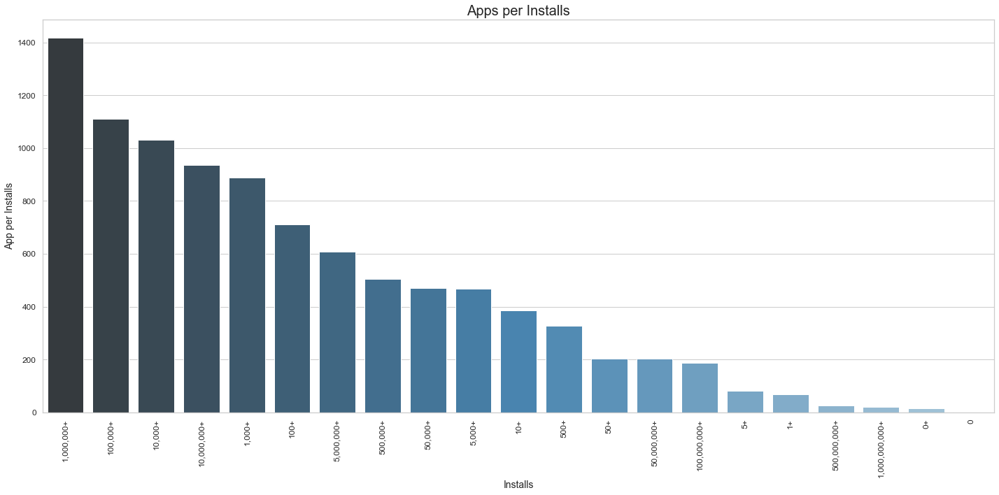

In [35]:
plt.figure(figsize=(20,10))
sns.barplot(x=data['Installs'].value_counts().index, y=data['Installs'].value_counts(),palette='Blues_d')
plt.ylabel("App per Installs")
plt.xlabel("Installs")
plt.title("Apps per Installs",size = 20)
plt.xticks(rotation=90)
save_fig("app4Installs")

Procediamo a codificare i valori in modo opportuno, rendendoli interi (eliminando cioè il carattere '+' e la virgola).

In [36]:
data.Installs = data.Installs.map(lambda value : int(value.replace("+","").replace(",","")))

In [37]:
data.Installs.head(10)

0       10000
1      500000
2     5000000
3    50000000
4      100000
5       50000
6       50000
7     1000000
8     1000000
9       10000
Name: Installs, dtype: int64

In [38]:
installs_tranformer = DiscreteTransformer('Installs', 5)
data = installs_tranformer.fit_transform(data)
mark_as_to_remove("Installs")

Così come con l'attributo "Size", anche con "Installs" si è deciso di optare per la binarizzazione.

Vediamo quali sono i range ottenuti:

In [39]:
pd.DataFrame.from_dict(data=installs_tranformer.get_bins_dict(), orient='index', columns=['Range'])

,Range
Installs_0,"[0.000,200000000.000)"
Installs_1,"[200000000.000,400000000.000)"
Installs_2,"[400000000.000,600000000.000)"
Installs_3,"[600000000.000,800000000.000)"
Installs_4,"[800000000.000,1000000000.000)"


## Type

Tale colonna risulta essere un attributo di tipo binario, in quanto gli unici valori che può assumere questo attributo sono "Free" e "Paid".
Esso però risulta essere una feature irrilevante in quanto il suo valore è ricavabile da "Price": si è dunque deciso di eliminarla.  

In ogni caso, analizziamo i valori presenti:


In [40]:
data.Type.unique()

array(['Free', 'Paid', nan], dtype=object)

In [41]:
data.Type[data.Type.isna()].index

Int64Index([9148], dtype='int64')

In [42]:
data.loc[9148]

App                        Command & Conquer: Rivals
Category                                      FAMILY
Rating                                             4
Reviews                                            0
Size                                         20.3949
Installs                                           0
Type                                             NaN
Price                                              0
Content Rating                          Everyone 10+
Genres                                      Strategy
Last Updated                           June 28, 2018
Current Ver                       Varies with device
Android Ver                       Varies with device
CAT_ART_AND_DESIGN                                 0
CAT_AUTO_AND_VEHICLES                              0
CAT_BEAUTY                                         0
CAT_BOOKS_AND_REFERENCE                            0
CAT_BUSINESS                                       0
CAT_COMICS                                    

Nonostante tale colonna verrà eliminata e non utilizzata nell'analisi si vuole fare un'osservazione: è presente un valore NaN in tale colonna, in particolare nella riga 9148. In corrispondenza di questo indice però l'attributo "Price" ha un valore noto, quindi possiamo ricavare il valore di "Type" prima di procedere con il plot.

In [43]:
data.Type[9148] = "Free" if data.loc[9148].Price == "0" else "Paid"
print(data.loc[9148])

App                        Command & Conquer: Rivals
Category                                      FAMILY
Rating                                             4
Reviews                                            0
Size                                         20.3949
Installs                                           0
Type                                            Free
Price                                              0
Content Rating                          Everyone 10+
Genres                                      Strategy
Last Updated                           June 28, 2018
Current Ver                       Varies with device
Android Ver                       Varies with device
CAT_ART_AND_DESIGN                                 0
CAT_AUTO_AND_VEHICLES                              0
CAT_BEAUTY                                         0
CAT_BOOKS_AND_REFERENCE                            0
CAT_BUSINESS                                       0
CAT_COMICS                                    

Saving figure Free vs Paid


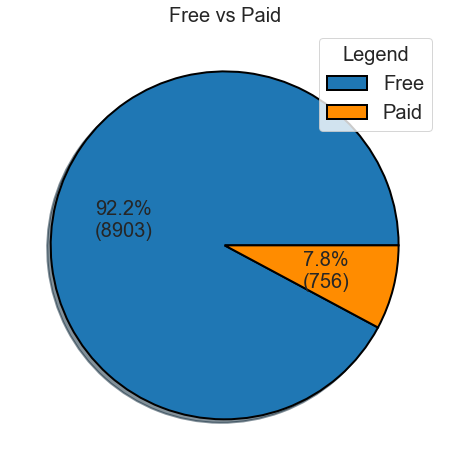

In [44]:
free = data.groupby('Type').count()
plt.figure(figsize=(12,8))

def func(pct, allvals):
    absolute = int(pct/100.*np.sum(allvals))
    return "{:.1f}%\n({:d})".format(pct, absolute)

wedges, texts, autotexts = plt.pie(free.App, explode=None, autopct=lambda pct: func(pct, free.App), shadow=True, colors=['tab:blue', 'darkorange'], wedgeprops = {'linewidth': 2,'edgecolor' :'black'})
legend = plt.legend(wedges, free.index, title="Legend", loc="best", prop={'size': 20})
plt.setp(legend.get_title(), fontsize='20')
plt.setp(autotexts, size=20)
plt.title("Free vs Paid", size=20)
save_fig("Free vs Paid", False)

In [45]:
mark_as_to_remove("Type")

## Price

L'attributo "Price" è un attributo facilmente trasformabile in numerico in quanto i valori presenti nella colonna sono 0 o \$x dove x è un float.
Per averne la certezza facciamoci stampare tutti i valori che compaiono in questa colonna:


In [46]:
data.Price.unique()

array(['0', '$4.99', '$3.99', '$6.99', '$1.49', '$2.99', '$7.99', '$5.99',
       '$3.49', '$1.99', '$9.99', '$7.49', '$0.99', '$9.00', '$5.49',
       '$10.00', '$24.99', '$11.99', '$79.99', '$16.99', '$14.99',
       '$1.00', '$29.99', '$12.99', '$2.49', '$10.99', '$1.50', '$19.99',
       '$15.99', '$33.99', '$74.99', '$39.99', '$3.95', '$4.49', '$1.70',
       '$8.99', '$2.00', '$3.88', '$25.99', '$399.99', '$17.99',
       '$400.00', '$3.02', '$1.76', '$4.84', '$4.77', '$1.61', '$2.50',
       '$1.59', '$6.49', '$1.29', '$5.00', '$13.99', '$299.99', '$379.99',
       '$37.99', '$18.99', '$389.99', '$19.90', '$8.49', '$1.75',
       '$14.00', '$4.85', '$46.99', '$109.99', '$154.99', '$3.08',
       '$2.59', '$4.80', '$1.96', '$19.40', '$3.90', '$4.59', '$15.46',
       '$3.04', '$4.29', '$2.60', '$3.28', '$4.60', '$28.99', '$2.95',
       '$2.90', '$1.97', '$200.00', '$89.99', '$2.56', '$30.99', '$3.61',
       '$394.99', '$1.26', '$1.20', '$1.04'], dtype=object)

In [47]:
class PriceTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self, dataframe, y=None):
        return self
    
    def transform(self, dataframe, y=None):
        dataframe.Price = dataframe.Price.map(lambda value: float(value[1 : ] if value[0] == '$' else value))

In [48]:
price_pipeline =  Pipeline([
                                ('price_trasformer', PriceTransformer())
                            ])

price_pipeline.fit_transform(data)
print(data.Price[data.Price > 0].head(100))

234     4.99
235     4.99
427     3.99
476     3.99
477     6.99
        ... 
2284    7.49
2285    1.50
2286    2.99
2287    3.99
2288    1.99
Name: Price, Length: 100, dtype: float64


Grafichiamo i prezzi per le app a pagamento

Saving figure app4Price


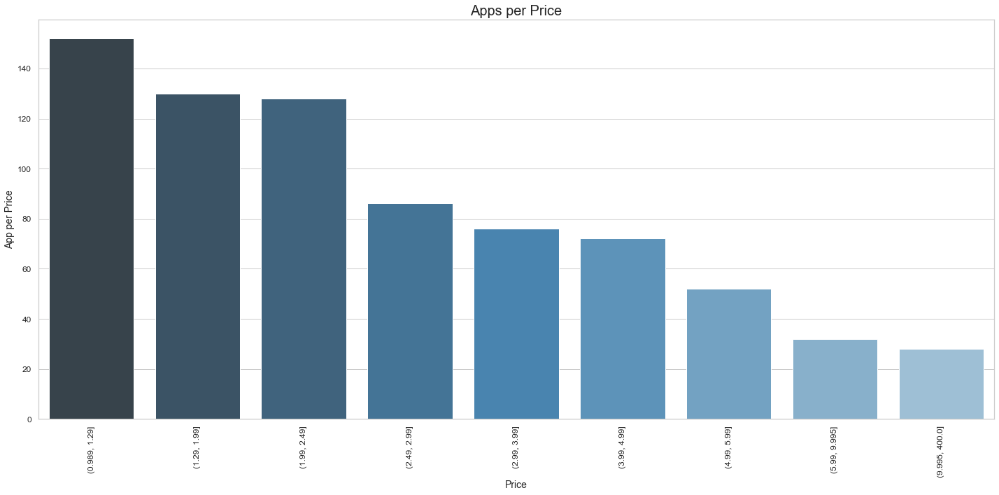

In [49]:
price_bins = pd.qcut(data.Price[data.Price > 0], q=10, duplicates='drop')
plt.figure(figsize=(20,10))
sns.barplot(x=price_bins.value_counts().index.sort_values(), y=price_bins.value_counts(),palette='Blues_d')
plt.ylabel("App per Price")
plt.xlabel("Price")
plt.title("Apps per Price",size = 20)
plt.xticks(rotation=90)
save_fig("app4Price")

Da tale plot, possiamo evincere che la maggior parte delle applicazioni a pagamento presenti nel nostro dataset ha prezzo inferiore a \$9.99 (la contentrazzione maggiore si ha tra \$0.99 e \$1.99).  
Non abbiamo però dettagli più specifici sulle app il cui prezzo ricade nella fascia (\$9.99, \$400]. Al fine di ottenere un quadro più preciso su questo range così vasto, procediamo con un ulteriore plot che metta in relazione le fasce di prezzo con il nostro attributo di classe ("Rating").

Saving figure PaidAppsPrice4Rating


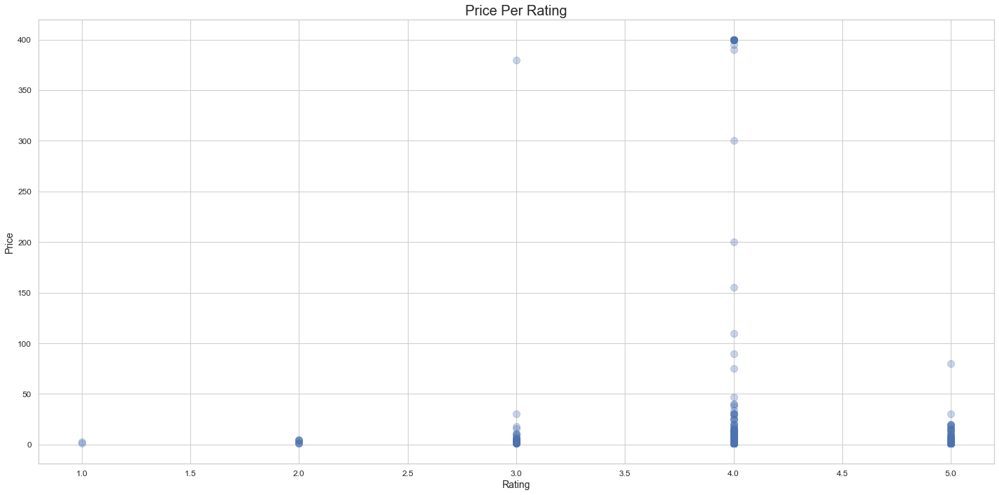

In [50]:
paid_apps_df = data[data['Price'] > 0]
paid_apps_df.plot(kind = "scatter", x = "Rating", y = "Price", alpha = 0.3, color = "b", figsize=(20,10), s =100)
plt.xlabel("Rating")
plt.ylabel("Price")
plt.title("Price Per Rating", size =20)
save_fig("PaidAppsPrice4Rating")

Si può notare come di fatto siano presenti poche app con prezzo superiore a $100.

Esaminiamo meglio questo aspetto.

In [51]:
for i in range(3):
    print("# of apps with price > $", (i+1)*100, "=", paid_apps_df[paid_apps_df.Price > (i+1)*100].index.size)

# of apps with price > $ 100 = 20
# of apps with price > $ 200 = 17
# of apps with price > $ 300 = 16


Essendo solo 20 le app con prezzo superiore a $100 e, come si può vedere dal plot precedente, sono quasi tutte app con "Rating" pari a 4 (classe prevalente che rende fortemente sbilanciato il dataset) crediamo che queste app possano essere degli outlier che daranno un contributo negativo nella classificazione: è stato perciò deciso di eliminare tali record dal dataset.

Infatti, dall'elenco di seguito riportato, si può vedere come le app in questione sono app per ostentare ricchezza.

In [52]:
data[['App', 'Price']][data.Price > 100]

,App,Price
4197,most expensive app (H),399.99
4362,💎 I'm rich,399.99
4367,I'm Rich - Trump Edition,400.00
5351,I am rich,399.99
5354,I am Rich Plus,399.99
5355,I am rich VIP,299.99
5356,I Am Rich Premium,399.99
5357,I am extremely Rich,379.99
5358,I am Rich!,399.99
5359,I am rich(premium),399.99


In [53]:
data.drop(data[data.Price > 100].index, inplace=True)

## Content Rating


E' l'attributo (di tipo stringa) che si può vedere come un "classificatore della maturità": 
il suo valore indica la fascia di età idonea all'uso dell'applicazione.    

Visualizziamo i possibili valori del suddetto attributo:

In [54]:
print(data["Content Rating"].unique())
print(data["Content Rating"].unique().size)

['Everyone' 'Teen' 'Everyone 10+' 'Mature 17+' 'Adults only 18+' 'Unrated']
6


Saving figure app4ContentRating


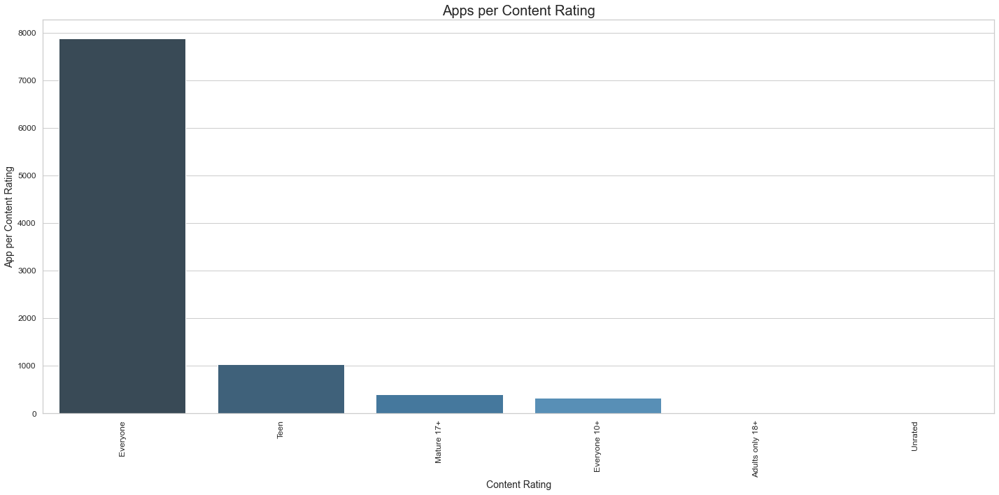

In [55]:
plt.figure(figsize=(20,10))
sns.barplot(x=data['Content Rating'].value_counts().index, y=data['Content Rating'].value_counts(),palette='Blues_d')
plt.ylabel("App per Content Rating")
plt.xlabel("Content Rating")
plt.title("Apps per Content Rating",size = 20)
plt.xticks(rotation=90)
save_fig("app4ContentRating")

Si può facimente notare che è un attributo di tipo nominale formato da soli 6 valori. Per poterlo analizzare con un
algoritmo di ML è necessario applicare una codifica, in questo particolare caso sarà adottato un OneHotEncoder.

In [56]:
class ContentRatingTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, labels):
        self.labels = labels
        pass

    def fit(self, dataframe, y=None):
        return self
    
    def transform(self, dataframe, y=None):
        return self

In [57]:
data = pd.concat([data, pd.get_dummies(data["Content Rating"], prefix="CR")], axis = 1)
mark_as_to_remove("Content Rating")

## Genres

L'attributo "Genres" è sicuramente il più complesso da un punto di vista della trattabilità. Presenta infatti una serie di stringhe, separate da ';', che descrivono i generi a cui appartiene la specifica applicazione.

Come per gli altri, procediamo per prima cosa a visualizzare quanti e quali solo i valori possibili:

In [58]:
data.Genres.unique()

array(['Art & Design', 'Art & Design;Pretend Play',
       'Art & Design;Creativity', 'Art & Design;Action & Adventure',
       'Auto & Vehicles', 'Beauty', 'Books & Reference', 'Business',
       'Comics', 'Comics;Creativity', 'Communication', 'Dating',
       'Education;Education', 'Education', 'Education;Creativity',
       'Education;Music & Video', 'Education;Action & Adventure',
       'Education;Pretend Play', 'Education;Brain Games', 'Entertainment',
       'Entertainment;Music & Video', 'Entertainment;Brain Games',
       'Entertainment;Creativity', 'Events', 'Finance', 'Food & Drink',
       'Health & Fitness', 'House & Home', 'Libraries & Demo',
       'Lifestyle', 'Lifestyle;Pretend Play',
       'Adventure;Action & Adventure', 'Arcade', 'Casual', 'Card',
       'Casual;Pretend Play', 'Action', 'Strategy', 'Puzzle', 'Sports',
       'Music', 'Word', 'Racing', 'Casual;Creativity',
       'Casual;Action & Adventure', 'Simulation', 'Adventure', 'Board',
       'Trivia', 'Role 

Come previsto, "Genres" può assumere una grande quantità di valori che al fine dell'analisi non sono interessanti, soprattutto perchè ci forniscono informazioni simili (seppur più dettagliate) dell'attributo "Category" che però è più facilmente gestibile.

Per tale motivo, si è deciso di eliminare la colonna dal dataset.

In [59]:
mark_as_to_remove("Genres")

## Last Updated

E' la data dell'ultimo aggiornamento dell'app. Come già detto precedentemente, pensiamo esserci un 
legame tra tale attributo e le recensioni: prima di poterlo appurare però abbiamo la necessità di
fare delle operazioni di preprocessing su tale attributo che al momento è nel formato "mese giorno, anno"
(con mese che è una stringa e anno e giorno numeri interi).

Proviamo a vedere se la nostra tesi risulta veritiera: volgiamo cioè verificare se a valori di "Last Updated" poco recenti, corrispondono punteggi inferiori.  
Per farlo plottiamo il punteggio per anno.

In [60]:
data_by_year = data.copy()
data_by_year["Last Updated"] = data["Last Updated"].map(lambda value: int(value.split(", ")[1]))
print(data_by_year.head(15))

App        Category  Rating  \
0      Photo Editor & Candy Camera & Grid & ScrapBook  ART_AND_DESIGN       4   
1                                 Coloring book moana  ART_AND_DESIGN       4   
2   U Launcher Lite – FREE Live Cool Themes, Hide ...  ART_AND_DESIGN       5   
3                               Sketch - Draw & Paint  ART_AND_DESIGN       4   
4               Pixel Draw - Number Art Coloring Book  ART_AND_DESIGN       4   
5                          Paper flowers instructions  ART_AND_DESIGN       4   
6             Smoke Effect Photo Maker - Smoke Editor  ART_AND_DESIGN       4   
7                                    Infinite Painter  ART_AND_DESIGN       4   
8                                Garden Coloring Book  ART_AND_DESIGN       4   
9                       Kids Paint Free - Drawing Fun  ART_AND_DESIGN       5   
10                            Text on Photo - Fonteee  ART_AND_DESIGN       4   
11            Name Art Photo Editor - Focus n Filters  ART_AND_DESIGN       4 

Saving figure LastUpdated4Rating


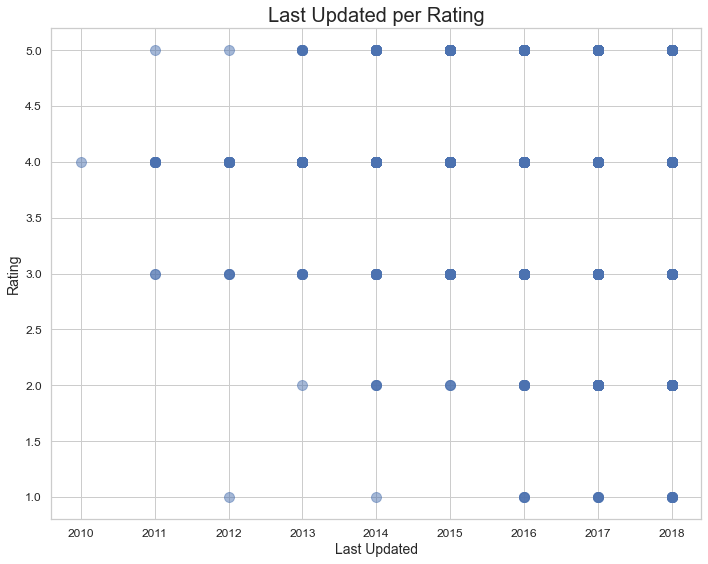

In [61]:
data_by_year.plot(kind="scatter", x="Last Updated", y="Rating", alpha=.5, color="b", figsize=(10,8), s=100)
plt.xlabel("Last Updated")
plt.ylabel("Rating")
plt.title("Last Updated per Rating", size=20)
save_fig("LastUpdated4Rating")

Dal grafico non è purtroppo possibile confermare o confutare la nostra ipotesi in  quanto ci sono troppe poche recensioni degli anni passati, come si può vedere di seguito:

In [62]:
for i in range(9):
    print("# app nel", 2010 + i, " = ", data_by_year[data_by_year["Last Updated"] == (2010 + i)].index.size)

# app nel 2010  =  1
# app nel 2011  =  15
# app nel 2012  =  26
# app nel 2013  =  108
# app nel 2014  =  203
# app nel 2015  =  448
# app nel 2016  =  779
# app nel 2017  =  1786
# app nel 2018  =  6273


Concentriamoci dunque a trasformare i valori di tale attributo sostituendoli con il corrispondente timestamp.

In [63]:
data['Last Updated'] = data['Last Updated'].apply(lambda x : time.mktime(datetime.datetime.strptime(x, '%B %d, %Y').timetuple()))

## Current Ver

L'attributo "Current Ver" è una stringa che indica l'ultima versione dell'app. Poichè tale valore è definito internamente dagli sviluppatori dell'app non vi è nessuna correlazione con i valori delle altre app. Ai fini della nostra analisi crediamo che tale attributo sia poco significativo e procediamo con la cancellazione.

In [64]:
mark_as_to_remove("Current Ver")

## Android Ver

"Android Ver" indica la versione minima di Android necessaria al fine di eseguire l'applicazione.   
Si ipotizza che se la versione minima di Android richiesta è una versione troppo recente, potrebbero esserci meno recensioni.

In [65]:
data["Android Ver"].unique()

array(['4.0.3 and up', '4.2 and up', '4.4 and up', '2.3 and up',
       '3.0 and up', '4.1 and up', '4.0 and up', '2.3.3 and up',
       'Varies with device', '2.2 and up', '5.0 and up', '6.0 and up',
       '1.6 and up', '1.5 and up', '2.1 and up', '7.0 and up',
       '5.1 and up', '4.3 and up', '4.0.3 - 7.1.1', '2.0 and up',
       '3.2 and up', '4.4W and up', '7.1 and up', '7.0 - 7.1.1',
       '8.0 and up', '5.0 - 8.0', '3.1 and up', '2.0.1 and up',
       '4.1 - 7.1.1', nan, '5.0 - 6.0', '1.0 and up', '2.2 - 7.1.1',
       '5.0 - 7.1.1'], dtype=object)

Visualizziamo ora il numero di app presenti nel dataset per versione di Android.

Saving figure app4AndroidVer


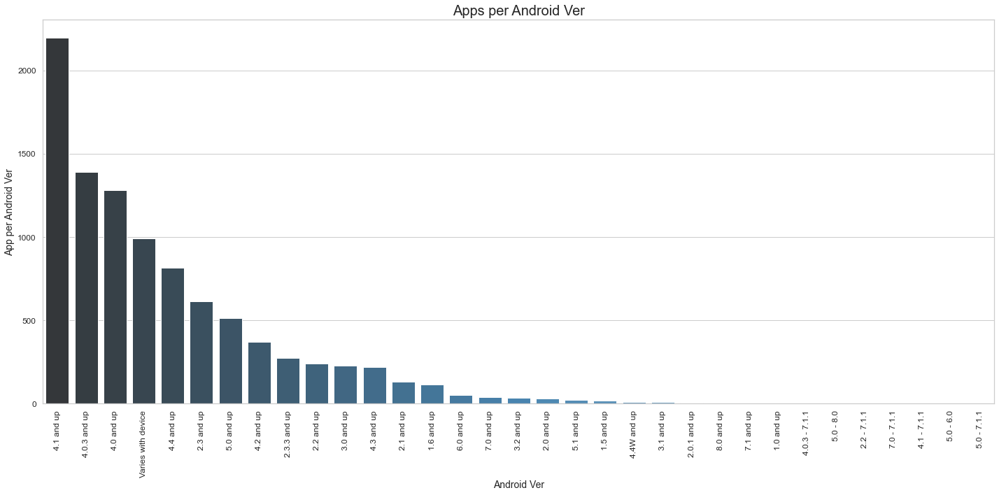

In [66]:
plt.figure(figsize=(20,10))
sns.barplot(x=data["Android Ver"].value_counts().index, y=data["Android Ver"].value_counts(),palette='Blues_d')
plt.ylabel("App per Android Ver")
plt.xlabel("Android Ver")
plt.title("Apps per Android Ver",size = 20)
plt.xticks(rotation=90)
save_fig("app4AndroidVer")

Vediamo che sono presenti diverse tipologie di valori per l'attributo nonché dei "nan" e dei "Varing with device".  
Al fine di rendere l'attributo utile per la nostra analisi, effettuiamo la seguente traformazione:  

1. si assegna ai valori "nan" e "Varing with device" la media dei valori degli altri record;  

2. si approssimano i valori dei restanti attributi alla major release di android più prossima (es. Android 4.4.x-> Android 4)

In [67]:
consistent_android_ver_mask = np.logical_and(data["Android Ver"] != "Varies with device", data["Android Ver"].notna()) 
tmp_data = data[consistent_android_ver_mask]

In [68]:
tmp_data["Android Ver"] = tmp_data["Android Ver"].map(lambda value : int(value[0]))
android_ver_avg = str(tmp_data["Android Ver"].mean())

In [69]:
data["Android Ver"][np.logical_not(consistent_android_ver_mask)] = android_ver_avg
data["Android Ver"] = data["Android Ver"].map(lambda value : int(value[0]))

In [70]:
tmp_data = None
consistent_android_ver_mask = None

Ripetiamo il medesimo plot fatto sopra dopo la trasformazione:

Saving figure app4AndroidVerFixed


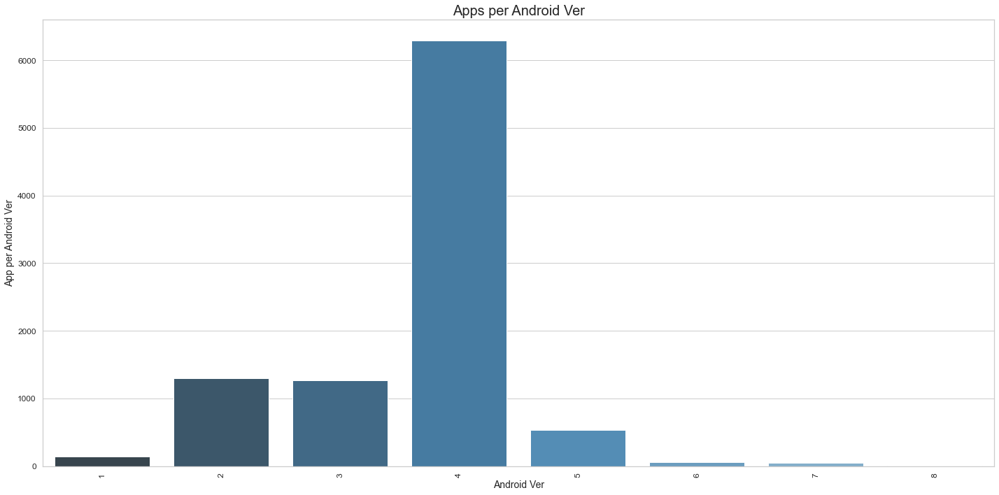

In [71]:
plt.figure(figsize=(20,10))
sns.barplot(x=data["Android Ver"].value_counts().index, y=data["Android Ver"].value_counts(),palette='Blues_d')
plt.ylabel("App per Android Ver")
plt.xlabel("Android Ver")
plt.title("Apps per Android Ver",size = 20)
plt.xticks(rotation=90)
save_fig("app4AndroidVerFixed")

In questo plot, come nel precedente, si può notare come i record presenti nel nostro dataset appartengono prevalentemente alla versione di Android 4, che secondo le statistiche di Google del 2018 (anno di creazione del presente dataset) era la versione installata sul 70% dei dispositivi. 

Saving figure AndroidVer4Reviews


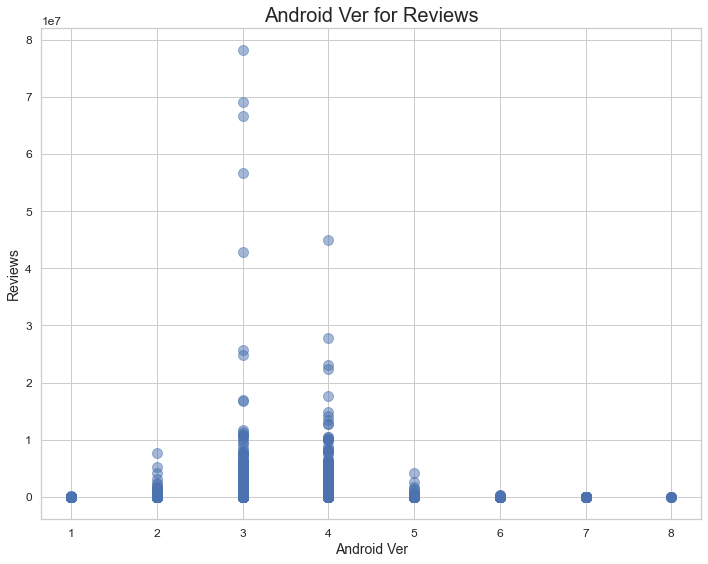

In [72]:
data.plot(kind="scatter", x="Android Ver", y="Reviews", alpha=.5, color="b", figsize=(10,8), s=100)
plt.xlabel("Android Ver")
plt.ylabel("Reviews")
plt.title("Android Ver for Reviews", size=20)
save_fig("AndroidVer4Reviews")

Da tale grafico risulta confermata la nostra tesi secondo cui per versioni più recenti di Android vi sono meno recensioni.

Inoltre, si evince anche che app che richiedono versioni di Android minima molto bassa (come Android 1) presentano un basso numero di Reviews. Il motivo di tale fenomeno è che il taget minimo molto basso è indice di applicazioni obsoleta e che probabilmente sarà scaricata un numero poco significativo di volte. Verifichiamo se è vero plottando la relazione tra Android Ver e Installs:

Saving figure AndroidVer4Installs


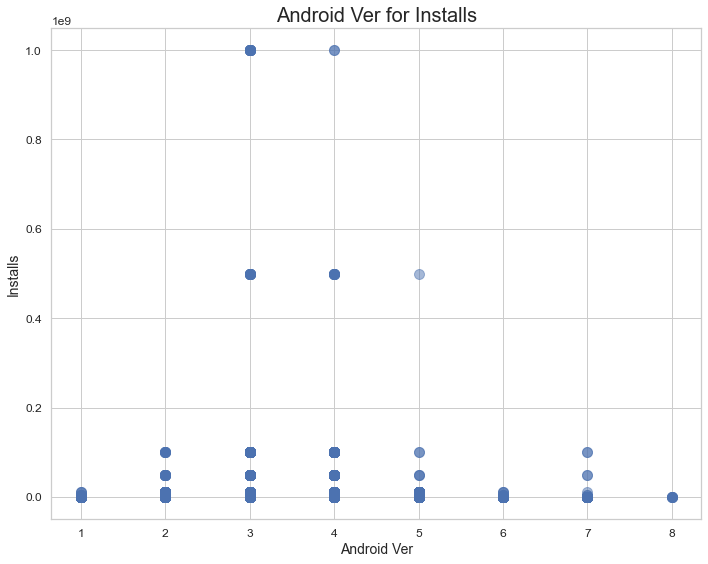

In [73]:
data.plot(kind="scatter", x="Android Ver", y="Installs", alpha=.5, color="b", figsize=(10,8), s=100)
plt.xlabel("Android Ver")
plt.ylabel("Installs")
plt.title("Android Ver for Installs", size=20)
save_fig("AndroidVer4Installs")

Il grafico conferma la nostra affermazione.

## Recap

Dopo aver reso numerici tutti gli attributi utili, possiamo usare la funzione describe() per ricapitolare i valori a nostra dispozione:

In [74]:
data.describe()

,Rating,Reviews,Size,Installs,Price,Last Updated,Android Ver,CAT_ART_AND_DESIGN,CAT_AUTO_AND_VEHICLES,CAT_BEAUTY,...,Installs_1,Installs_2,Installs_3,Installs_4,CR_Adults only 18+,CR_Everyone,CR_Everyone 10+,CR_Mature 17+,CR_Teen,CR_Unrated
count,9639.000000,9.639000e+03,9639.000000,9.639000e+03,9639.000000,9.639000e+03,9639.000000,9639.000000,9639.000000,9639.000000,...,9639.0,9639.000000,9639.0,9639.000000,9639.000000,9639.000000,9639.000000,9639.000000,9639.000000,9639.000000
mean,4.084864,2.170410e+05,20.417477,7.793622e+06,0.361895,1.509376e+09,3.639382,0.006640,0.008818,0.005498,...,0.0,0.002490,0.0,0.002075,0.000311,0.817927,0.033406,0.040772,0.107376,0.000207
std,0.547645,1.833192e+06,20.401890,5.381286e+07,2.382639,3.516753e+07,0.894200,0.081218,0.093496,0.073952,...,0.0,0.049839,0.0,0.045506,0.017640,0.385925,0.179703,0.197772,0.309607,0.014404
min,1.000000,0.000000e+00,0.008000,0.000000e+00,0.000000,1.274393e+09,1.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.000000,2.500000e+01,5.300000,1.000000e+03,0.000000,1.501841e+09,3.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
50%,4.000000,9.780000e+02,16.000000,1.000000e+05,0.000000,1.525471e+09,4.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
75%,4.000000,2.949000e+04,25.000000,1.000000e+06,0.000000,1.531778e+09,4.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,5.000000,7.815831e+07,100.000000,1.000000e+09,89.990000,1.533679e+09,8.000000,1.000000,1.000000,1.000000,...,0.0,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Analizziamo se esiste una correlazione tra gli attributi: avendo applicato più volte il OneHotEncoder però non possiamo applicarlo direttamente sul nostro dataset processato. Vdiamo quindi solo la correlazione tra gli attributi a cui non è stato applicato il One Hot Enconding.

In [75]:
to_plot = data[["Rating", "Reviews", "Size", "Installs", "Price", "Last Updated", "Android Ver"]]
to_plot.head(10)

,Rating,Reviews,Size,Installs,Price,Last Updated,Android Ver
0,4,159,19.0,10000,0.0,1.515280e+09,4
1,4,967,14.0,500000,0.0,1.515971e+09,4
2,5,87510,8.7,5000000,0.0,1.533074e+09,4
3,4,215644,25.0,50000000,0.0,1.528409e+09,4
4,4,967,2.8,100000,0.0,1.529446e+09,4
5,4,167,5.6,50000,0.0,1.490483e+09,2
6,4,178,19.0,50000,0.0,1.524694e+09,4
7,4,36815,29.0,1000000,0.0,1.528927e+09,4
8,4,13791,33.0,1000000,0.0,1.505858e+09,3
9,5,121,3.1,10000,0.0,1.530569e+09,4


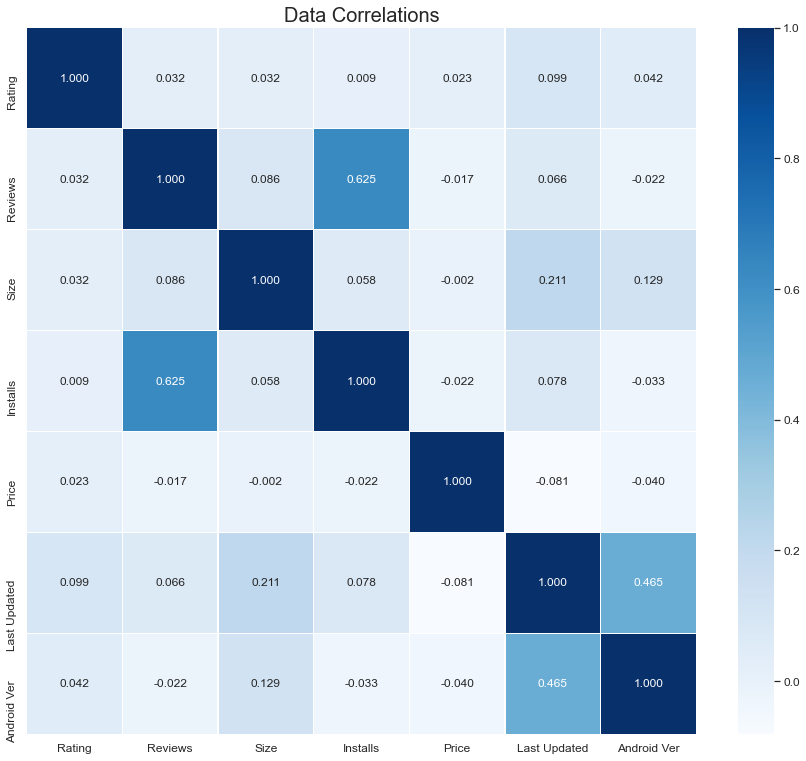

Saving figure DataCorrelations


<Figure size 432x288 with 0 Axes>

In [76]:
fig,ax = plt.subplots(figsize=(15, 13))
fig = sns.heatmap(to_plot.corr(), annot=True, linewidths=.5, fmt='.3f', cmap='Blues')
plt.title("Data Correlations", size=20)
plt.show()
figure = fig.get_figure()
save_fig("DataCorrelations", False)

Dalla matrice di correlazione è possibile evincere che esiste una correlazione rilevante tra gli attributi "Reviews" e "Installs": questa è una condizione prevedibile poichè il numero di review dipende dal numero di installazioni. 

Inoltre, si può riconfermare la nostra ipotesi sull'esistenza di un legame tra "Android Ver" e "Last Updated".

Ora possiamo eliminare tutte le colonne non necessarie all'analisi (raccolte nella lista "to_remove").

In [77]:
data_backup = data #used later
mark_as_to_remove("App")
data = data.drop(to_remove, axis=1, inplace=False)

In [78]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9639 entries, 0 to 10840
Data columns (total 54 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Rating                   9639 non-null   int32  
 1   Reviews                  9639 non-null   int32  
 2   Price                    9639 non-null   float64
 3   Last Updated             9639 non-null   float64
 4   Android Ver              9639 non-null   int64  
 5   CAT_ART_AND_DESIGN       9639 non-null   uint8  
 6   CAT_AUTO_AND_VEHICLES    9639 non-null   uint8  
 7   CAT_BEAUTY               9639 non-null   uint8  
 8   CAT_BOOKS_AND_REFERENCE  9639 non-null   uint8  
 9   CAT_BUSINESS             9639 non-null   uint8  
 10  CAT_COMICS               9639 non-null   uint8  
 11  CAT_COMMUNICATION        9639 non-null   uint8  
 12  CAT_DATING               9639 non-null   uint8  
 13  CAT_EDUCATION            9639 non-null   uint8  
 14  CAT_ENTERTAINMENT      

***

# Training e Test Set 

In [79]:
train_set, test_set = train_test_split(data, test_size=0.3, random_state=13)

Verifichiamo se il test set è ben costruito:

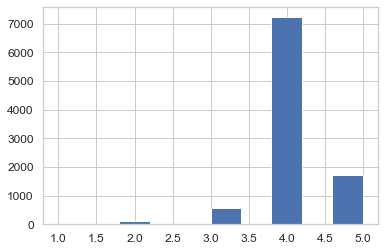

In [80]:
data.Rating.hist()  

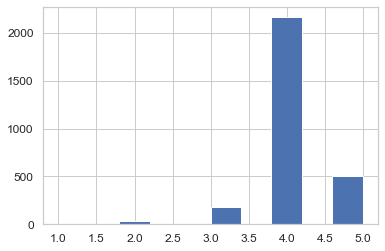

In [81]:
test_set.Rating.hist()

Poichè i due grafici presentano lo stesso andamento, il test set è ben costruito e rappresentativo.  

Eliminiamo l'attributo di classe ("Rating") e l'attributo identificante ("App") così da procedere con la fase di traning.

In [82]:
train_labels = train_set["Rating"].copy()
train_set.drop("Rating", axis=1, inplace=True)

In [83]:
test_labels = test_set["Rating"].copy()
test_set.drop("Rating", axis=1, inplace=True)

****    

# Classificazione

Al fine di memorizzare le metriche che ci saranno necessarie per confrontare i risultati ottenuti con i vari classificatori (sia sul training set sia sul test set) costruiamo due dataframe che riempiremo volta per volta.

In [84]:
metrics_train_df = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1-Score'])
metrics_test_df = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1-Score'])

## KNN Classifier

Il K-Nearest Neighbor è un tipo di classificazione supervisionata basato sul concetto di distanza: un nuovo record r viene inserito nella classe che presenta un numero maggiore di rappresentati tra i k vicini più vicini ad r.  

Vi sono due scelte cruciali per l'applicazione di questo algoritmo:  

1. la scelta del valore k;  
    
2. la scelta della misura di somiglianza.  
    
Discutiamo ora i pro e i contro dell'algoritmo: il KNN risulta essere particolarmente semplice da utilizzare in quanto non richiede la costruzione del modello e, inoltre, è un algoritmo piuttosto flessibile (le classi non devono avere confini netti o forme particolari). Il KNN però presenta anche alcuni contro di cui bisogna discutere. Innanzi tutto, per utilizzarlo è necessaria una fase di prepocessing che includa la normalizzazione dei dati, in più è sensibile a rumore e agli outliers (tali aspetti sono amplificati se il valore di k è troppo piccolo o troppo grande). In fine, il costo della classificazione è linearmente dipendente alla dimensione del dataset, quindi può avere costi eccessivi se non si utilizzano ottimizzazioni di tale algoritmo (che permettono di calcolare solo una parte di tutte le distanze).

In [85]:
knn_classifier = KNeighborsClassifier(weights='uniform', leaf_size=30)

Valutiamo l'andamento dell'accuratezza al variare del parametro k:

Saving figure kValues


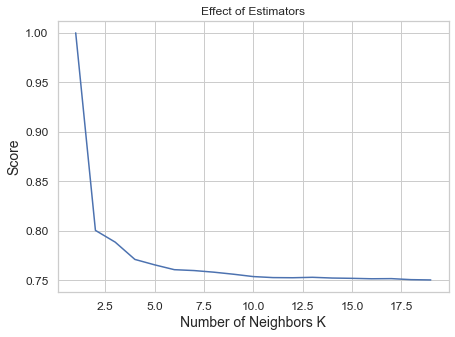

In [86]:
n_neighbors = np.arange(1, 20, 1)
scores = []
for n in n_neighbors:
    knn_classifier.set_params(n_neighbors=n)
    knn_classifier.fit(train_set, train_labels)
    scores.append(knn_classifier.score(train_set, train_labels))
plt.figure(figsize=(7, 5))
plt.title("Effect of Estimators")
plt.xlabel("Number of Neighbors K")
plt.ylabel("Score")
plt.plot(n_neighbors, scores)
save_fig("kValues", False) 

Dal grafico si evince che il KNN in questa circostanza risulta avere un'accuracy più alta al diminuire di k, probabilmente dovuto al fatto che il dataset è fortemente sbilanciato.

Scegliamo k=2 per classificare.

In [87]:
knn_classifier.set_params(n_neighbors=2)
knn_classifier.fit(train_set, train_labels)

KNeighborsClassifier(n_neighbors=2)

In [88]:
knn_train_pred = knn_classifier.predict(train_set)

Saving figure KnnNotNormalizedConfusionMatrixTR


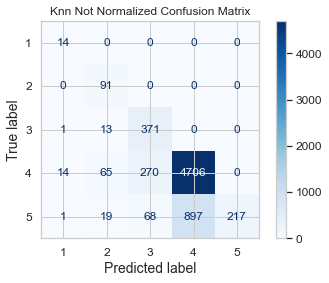

In [89]:
disp = plot_confusion_matrix(knn_classifier, train_set, train_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize=None)

disp.ax_.set_title("Knn Not Normalized Confusion Matrix")
save_fig("KnnNotNormalizedConfusionMatrixTR", False)


Questi valori, non ci danno un'idea dell'errore commesso, useremo dunque la matrice di confusione normalizzata:

Saving figure KnnConfusionMatrixTR


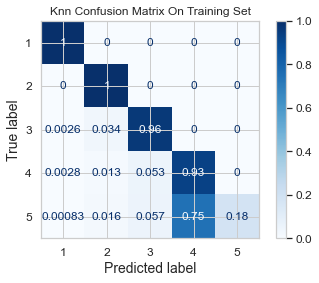

In [90]:
disp = plot_confusion_matrix(knn_classifier, train_set, train_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Knn Confusion Matrix On Training Set")
save_fig("KnnConfusionMatrixTR", False)

Dalla confusion matrix normalizzata riusciamo a ricavare la percentuale di errore nella classificazione: in particolare, vediamo che la classificazione peggiore si ha con le app il cui "Rating" è 1. Avevamo infatti già discusso del fatto che tale classe risulta la più rara.  

Calcoliamo ora una serie di metriche per valutare ulteriormente il Knn Classifier. 

In [91]:
print_metrics(train_labels, knn_train_pred)

Accuracy: 0.8002074996294649 

Precision: 0.8447861074079182 

Recall: 0.8002074996294649 

F1-Score: 0.7649412761097694


In [92]:
metrics_train_df.loc['KNN'] = get_metrics(train_labels, knn_train_pred)

Applichiamo il Knn Classifier al test set.

In [93]:
knn_test_pred = knn_classifier.predict(test_set)

Saving figure KnnConfusionMatrixTE


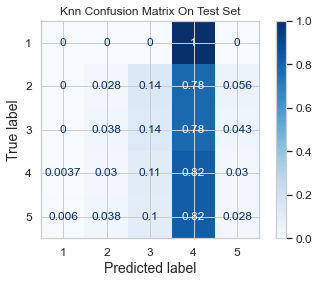

In [94]:
disp = plot_confusion_matrix(knn_classifier, test_set, test_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Knn Confusion Matrix On Test Set")
save_fig("KnnConfusionMatrixTE", False)

In [95]:
print_metrics(test_labels, knn_test_pred)

Accuracy: 0.6300138312586445 

Precision: 0.5941075311132531 

Recall: 0.6300138312586445 

F1-Score: 0.6025984794070149


In [96]:
metrics_test_df.loc['KNN'] = get_metrics(test_labels, knn_test_pred)

Nonostante i valori riportati non sono bassi, dalla matrice di confusione si può vedere come il Knn classifichi quasi tutti i sample di classe 4: il problema è che il dataset è fortemente bilanciato e "i vicini più prossimi" risultano essere quasi sempre di classe 4.

## Random Forest Classifier

Il Random Forest è un classificatore appartenente alle tecniche ensamble. Queste sono caratterizzate dall'utilizzare n classificatori combinandoli insieme: è stato infatti dimostrato che se si l'unione di classificatori (che hanno error rate al di sotto del 50%) produce un errore totale che risulterà notevolmente minore di quello dei singoli.

Nello specifico, i singoli classificatori usati nel Random Forest sono dei "Decision Tree Classifier", ciascuno dei quali lavora su un sottoinsieme di attributi del dataset estratti in maniera random (quindi potrebbero esserci features che non verranno considerate).

In [97]:
random_forest_classifier = RandomForestClassifier(n_estimators=20, random_state=13)

In [98]:
random_forest_classifier.fit(train_set, train_labels)
rf_train_pred = random_forest_classifier.predict(train_set)

Saving figure RFConfusionMatrixTR


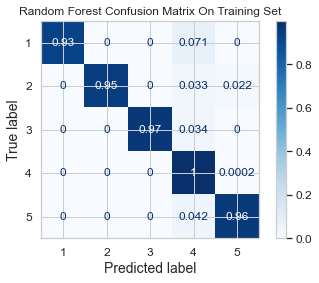

In [99]:
disp = plot_confusion_matrix(random_forest_classifier, train_set, train_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Random Forest Confusion Matrix On Training Set")
save_fig("RFConfusionMatrixTR", False)

Nella matrice di confusione si può notare come gli elementi della diagonale presentino un colore più forte, che corrisponde ad una percentuale di correttezza più alta: questo vuol dire che il Random Forest Classifier riesce a classificare piuttosto bene. Questo ci sarà confermato anche dai valori di accuracy, precision, recall ed f1-score di seguito calcolati.

In [100]:
print_metrics(train_labels, rf_train_pred)

Accuracy: 0.9894768045057062 

Precision: 0.9895901456837547 

Recall: 0.9894768045057062 

F1-Score: 0.989399181872022


In [101]:
metrics_train_df.loc['RandomForest'] = get_metrics(train_labels, rf_train_pred)

Valori così elevati ci suggeriscono la presenza di overfitting, che potrà essere confermata o meno applicando tale classificatore al test set.

In [102]:
rf_test_pred = random_forest_classifier.predict(test_set)

Saving figure RFConfusionMatrixTE


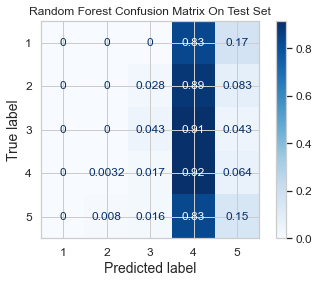

In [103]:
disp = plot_confusion_matrix(random_forest_classifier, test_set, test_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Random Forest Confusion Matrix On Test Set")
save_fig("RFConfusionMatrixTE", False)

In [104]:
print_metrics(test_labels, rf_test_pred)

Accuracy: 0.7140387275242047 

Precision: 0.6388985998253293 

Recall: 0.7140387275242047 

F1-Score: 0.6622900308320255


In [105]:
metrics_test_df.loc['RandomForest'] = get_metrics(test_labels, rf_test_pred)

Come ci si aspettava dai i risultati sul training set, tale classificatore è specializzato sul training set, e nel test set classifica quasi tutti i campioni come di classe 4 a causa dello sbilanciamento del dataset.

Cerchiamo di ottenere dei valori migliori facendo del "Parameter Tuning".

In [106]:
n_estimators = [int(x) for x in np.linspace(start = 50, stop = 500, num = 10)]

max_features = ['auto', 'sqrt', 'log2']

max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

min_samples_split = [2, 5, 10]

min_samples_leaf = [1, 2, 4]

bootstrap = [True, False]

criterion = ['gini', 'entropy']


random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [107]:
if not checkpoint_exists("bestRandomForest.sa"):
    gridF = GridSearchCV(random_forest_classifier, random_grid, cv = 3, verbose = 1, n_jobs = -1)
    gridF.fit(train_set, train_labels)
    bestF = gridF.best_estimator_
    save_checkpoint(bestF, "bestRandomForest.sa")
else:
    bestF = load_checkpoint("bestRandomForest.sa")

In [108]:
bestF.fit(train_set, train_labels)
bestF_train_pred = bestF.predict(train_set)

Saving figure BestRFConfusionMatrixTR


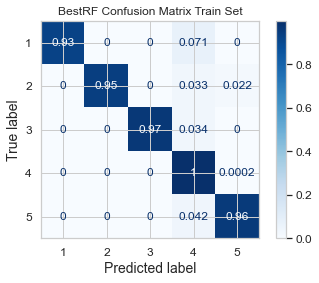

In [109]:
disp = plot_confusion_matrix(random_forest_classifier, train_set, train_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')
 
disp.ax_.set_title("BestRF Confusion Matrix Train Set")
save_fig("BestRFConfusionMatrixTR", False)

In [110]:
print_metrics(train_labels, bestF_train_pred)

Accuracy: 0.8302949459018824 

Precision: 0.861635637344196 

Recall: 0.8302949459018824 

F1-Score: 0.7947906438858955


In [111]:
metrics_train_df.loc['BestRF'] = get_metrics(train_labels, bestF_train_pred)

In [112]:
bestF_test_pred = bestF.predict(test_set)

Saving figure BestRFConfusionMatrix


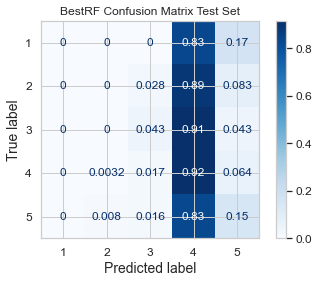

In [113]:
disp = plot_confusion_matrix(random_forest_classifier, test_set, test_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')
 
disp.ax_.set_title("BestRF Confusion Matrix Test Set")
save_fig("BestRFConfusionMatrix", False)

In [114]:
print_metrics(test_labels, bestF_test_pred)

Accuracy: 0.7506915629322268 

Precision: 0.6964864511812178 

Recall: 0.7506915629322268 

F1-Score: 0.6585932505412867


In [115]:
metrics_test_df.loc['BestRF'] = get_metrics(test_labels, bestF_test_pred)

Anche se di poco, con il parameter tuning siamo riusciti a migliorare le performance del Random Forest sul test set, infatti il modello risulta non andare in overfitting.

Un altro tentativo per cercare di migliorare le performance è usare un importante parametro che il Random Forest ci mette a disposizione: "feature\_importances\_". Con esso riusciamo ad ottenere un ordinamento delle colonne in base all'importanza che esse hanno nel discriminare i vari record e, quindi, le varie classi.

In [116]:
columns = train_set.columns.values

In [117]:
feature_importances = random_forest_classifier.feature_importances_

In [118]:
importances_df = pd.DataFrame(columns=['column', 'feature_importance'])
i = 0
for name, importance in zip(columns, feature_importances):
    importances_df.loc[i] = [name,importance]
    i = i + 1

In [119]:
importances_df.sort_values(by=['feature_importance'], ascending=False)

,column,feature_importance
0,Reviews,0.358020
2,Last Updated,0.328700
3,Android Ver,0.058919
1,Price,0.032221
15,CAT_FAMILY,0.011624
37,Size_0,0.011588
38,Size_1,0.010543
18,CAT_GAME,0.008162
33,CAT_TOOLS,0.008029
48,CR_Everyone,0.008008


Estraiamo le 15 colonne più importanti e costruiamo un dataset temporaneo che contenga solo tali colonne: su questo applichiamo il Random Forest.

In [120]:
top_15 = importances_df.sort_values(by=['feature_importance'], ascending=False)[:15]

In [121]:
top_15_features = top_15.loc[top_15.index]['column'].values
top_15_features

array(['Reviews', 'Last Updated', 'Android Ver', 'Price', 'CAT_FAMILY',
       'Size_0', 'Size_1', 'CAT_GAME', 'CAT_TOOLS', 'CR_Everyone',
       'CAT_PRODUCTIVITY', 'CAT_MEDICAL', 'CR_Teen', 'CAT_BUSINESS',
       'CAT_HEALTH_AND_FITNESS'], dtype=object)

In [122]:
train_top_15 = train_set[top_15_features]

In [123]:
test_top_15 = test_set[top_15_features]

In [124]:
random_forest_classifier.fit(train_top_15, train_labels)
rf_top15_train_pred = random_forest_classifier.predict(train_top_15)

Saving figure RFConfusionMatrixTop15TR


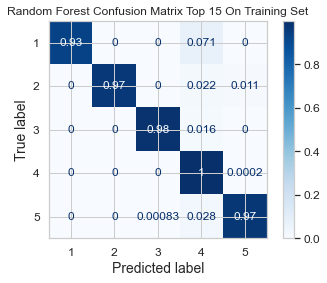

In [125]:
disp = plot_confusion_matrix(random_forest_classifier, train_top_15, train_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Random Forest Confusion Matrix Top 15 On Training Set")
save_fig("RFConfusionMatrixTop15TR", False)

In [126]:
print_metrics(train_labels, rf_top15_train_pred)

Accuracy: 0.993182155031866 

Precision: 0.9932243529965727 

Recall: 0.993182155031866 

F1-Score: 0.9931476206099664


In [127]:
rf_top15_test_pred = random_forest_classifier.predict(test_top_15)

Saving figure RFConfusionMatrixTop15TE


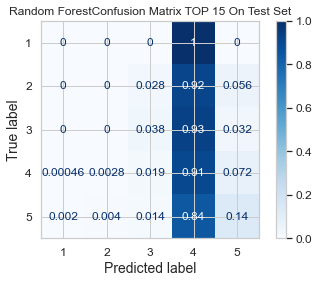

In [128]:
disp = plot_confusion_matrix(random_forest_classifier, test_top_15, test_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Random ForestConfusion Matrix TOP 15 On Test Set")
save_fig("RFConfusionMatrixTop15TE", False)

In [129]:
print_metrics(test_labels, rf_top15_test_pred)

Accuracy: 0.7040110650069157 

Precision: 0.6246069531685783 

Recall: 0.7040110650069157 

F1-Score: 0.6527900209175546


I risultati ottenuti utilizzando solo le 15 features più importanti non risultano essere migliori al contrario di come ci si aspettava.

## One versus One e One versus Rest  

Quando, come in questo caso, siamo in un presenza di classificazione multiclasse ci sono dei classificatori (come ad esempio il Knn Classifier o il Random Forest Classifier) che si adattano automaticamente a gestire la presenza di più classi.

Ci sono casi, però, in cui bisogna "estendere" i classificatori binari per utilizzarli in tale scenario.

Le strategie principali, che consistono nell'adettare i predittori binari a lavorare con N classi, sono:

1. One vs One: per N classi si costruiscono N*(N-1)/2 classificatori, cioè uno per ogni possibile coppia di attributi: siamo tornati ad una classificazione binaria.

2. One vs Rest: per N classi si generano N classificatori e l'i-esimo di questi considera come positiva l'i-esima classe e tutte le altre come negativa;

Tentiamo quindi di classificare una volta con la strategia One vs One e poi con la One vs Rest, utilizzando sempre il Random Forest come predittore.

In [130]:
ovo_classifier = OneVsOneClassifier(RandomForestClassifier(n_estimators=10, random_state=13))
ovo_classifier.fit(train_set, train_labels)
ovo_train_pred = ovo_classifier.predict(train_set)

Saving figure OvoConfusionMatrixTR


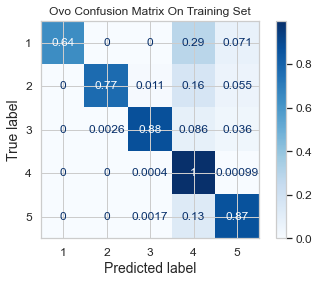

In [131]:
disp = plot_confusion_matrix(ovo_classifier, train_set, train_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Ovo Confusion Matrix On Training Set")
save_fig("OvoConfusionMatrixTR", False)

In [132]:
print_metrics(train_labels, ovo_train_pred)

Accuracy: 0.9641322069067734 

Precision: 0.9647376593252629 

Recall: 0.9641322069067734 

F1-Score: 0.9631110540672366


In [133]:
metrics_train_df.loc['OvO'] = get_metrics(train_labels, ovo_train_pred)

Usiamolo sul test set:

In [134]:
ovo_test_pred = ovo_classifier.predict(test_set)

Saving figure OvoConfusionMatrixTE


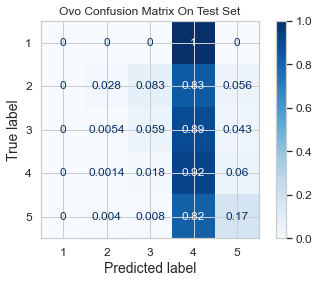

In [135]:
disp = plot_confusion_matrix(ovo_classifier, test_set, test_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Ovo Confusion Matrix On Test Set")
save_fig("OvoConfusionMatrixTE", False)

In [136]:
print_metrics(test_labels, ovo_test_pred)

Accuracy: 0.7233748271092669 

Precision: 0.6557505392001337 

Recall: 0.7233748271092669 

F1-Score: 0.67356142197783


In [137]:
metrics_test_df.loc['OvO'] = get_metrics(test_labels, ovo_test_pred)

Anche stavolta il risultato risente dello sbilanciamento del dataset. Tentiamo quindi con il One vs Rest.

In [138]:
ovr_classifier = OneVsRestClassifier(RandomForestClassifier(n_estimators=10, random_state=13))
ovr_classifier.fit(train_set, train_labels)
ovr_train_pred = ovr_classifier.predict(train_set)

Saving figure OvrConfusionMatrixTR


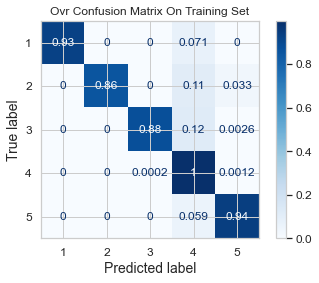

In [139]:
disp = plot_confusion_matrix(ovr_classifier, train_set, train_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Ovr Confusion Matrix On Training Set")
save_fig("OvrConfusionMatrixTR", False)

In [140]:
print_metrics(train_labels, ovr_train_pred)

Accuracy: 0.9793982510745517 

Precision: 0.9797423981108511 

Recall: 0.9793982510745517 

F1-Score: 0.979057434600586


In [141]:
metrics_train_df.loc['OvR'] = get_metrics(train_labels, ovr_train_pred)

Usiamolo sul test set:

In [142]:
ovr_test_pred = ovr_classifier.predict(test_set)

Saving figure OvrConfusionMatrixTE


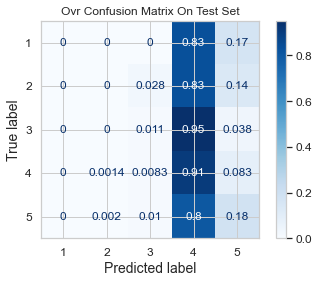

In [143]:
disp = plot_confusion_matrix(ovr_classifier, test_set, test_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Ovr Confusion Matrix On Test Set")
save_fig("OvrConfusionMatrixTE", False)

In [144]:
print_metrics(test_labels, ovr_test_pred)

Accuracy: 0.7116182572614108 

Precision: 0.6333465278298336 

Recall: 0.7116182572614108 

F1-Score: 0.6618485519013323


In [145]:
metrics_test_df.loc['OvR'] = get_metrics(test_labels, ovr_test_pred)

Mettiamo le due tecniche a confronto:

In [146]:
accuracyOVO, precisionOVO, recallOVO, f1_scoreOVO = get_metrics(train_labels, ovo_train_pred)
accuracyOVR, precisionOVR, recallOVR, f1_scoreOVR = get_metrics(train_labels, ovr_train_pred)
accuracyOVO_test, precisionOVO_test, recallOVO_test, f1_scoreOVO_test = get_metrics(test_labels, ovo_test_pred)
accuracyOVR_test, precisionOVR_test, recallOVR_test, f1_scoreOVR_test = get_metrics(test_labels, ovr_test_pred)
values = np.array([accuracyOVO, precisionOVO, recallOVO, f1_scoreOVO, accuracyOVO_test, precisionOVO_test, recallOVO_test, f1_scoreOVO_test, accuracyOVR, precisionOVR, recallOVR, f1_scoreOVR, accuracyOVR_test, precisionOVR_test, recallOVR_test, f1_scoreOVR_test])
df = pd.DataFrame(values.reshape(4,4), index=['OVO_train', 'OVO_test', 'OVR_train', 'OVR_test'], columns=['accuracy', 'precision', 'recall', 'f1-score'])
df

,accuracy,precision,recall,f1-score
OVO_train,0.964132,0.964738,0.964132,0.963111
OVO_test,0.723375,0.655751,0.723375,0.673561
OVR_train,0.979398,0.979742,0.979398,0.979057
OVR_test,0.711618,0.633347,0.711618,0.661849


In tutte le misure risulta superiore il "One vs Rest" sia per quanto concerne il training set e sia per il test set.

## AdaBoost Classifier

Un altro classificatore che appartiene alla famiglia delle ensamble technique è l'AdaBoost: in particolare esso è un'implementazione del Boosting. Si tratta di una procedura iterativa per adattare la distribuzione del training set al fine di potersi concentrare maggiormente sui record precedentemente misclassificati.

L'AdaBoost applica in cascata i classificatori e l'i-esimo predittore si concentra maggiormente sui campioni classificati male dal suo predecessore.   

Ad ogni passo si tiene conto di:  

1. se un elemento è stato classificato correttamente si riduce la possibilità di essere selezionato, altrimenti la si aumenta;  

2. se un elemento non è stato selezionato al passo precedente la probabilità di essere selezionato aumenta.

In [147]:
decision_tree_classifier = DecisionTreeClassifier()

In [148]:
adaboost_classifier = AdaBoostClassifier(base_estimator=decision_tree_classifier, n_estimators=100, algorithm="SAMME.R", learning_rate=0.5,random_state=13)

In [149]:
adaboost_classifier.fit(train_set, train_labels)
adaboost_train_pred = adaboost_classifier.predict(train_set)

Saving figure AdaBoostConfusionMatrixTR


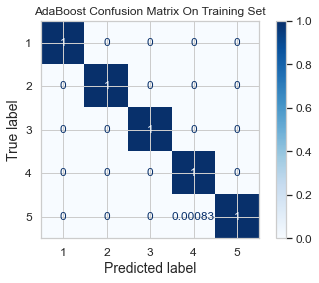

In [150]:
disp = plot_confusion_matrix(adaboost_classifier, train_set, train_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("AdaBoost Confusion Matrix On Training Set")
save_fig("AdaBoostConfusionMatrixTR", False)

In [151]:
print_metrics(train_labels, adaboost_train_pred)

Accuracy: 0.9998517859789536 

Precision: 0.9998518152934357 

Recall: 0.9998517859789536 

F1-Score: 0.9998517624689272


In [152]:
metrics_train_df.loc['AdaBoost'] = get_metrics(train_labels, adaboost_train_pred)

Trovare valori che così vicini al 100% in tutte le metriche indica la presenza di overfitting nel modello.

Vediamo cosa accade con il test set:

In [153]:
adaboost_test_pred = adaboost_classifier.predict(test_set)

Saving figure AdaBoostConfusionMatrixTE


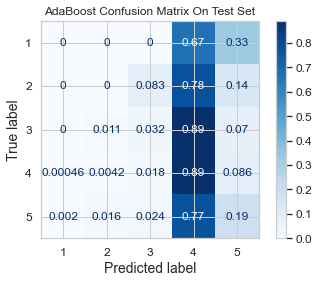

In [154]:
disp = plot_confusion_matrix(adaboost_classifier, test_set, test_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("AdaBoost Confusion Matrix On Test Set")
save_fig("AdaBoostConfusionMatrixTE", False)

In [155]:
print_metrics(test_labels, adaboost_test_pred)

Accuracy: 0.7015905947441217 

Precision: 0.6357208662306518 

Recall: 0.7015905947441217 

F1-Score: 0.6615008721158897


In [156]:
metrics_test_df.loc['AdaBoost'] = get_metrics(test_labels, adaboost_test_pred)

## MLP

In [157]:
mlp_classifier = MLPClassifier(learning_rate='adaptive')
mlp_classifier.fit(train_set, train_labels)

MLPClassifier(learning_rate='adaptive')

In [158]:
mlp_train_pred = mlp_classifier.predict(train_set)

Saving figure MLPConfusionMatrixTR


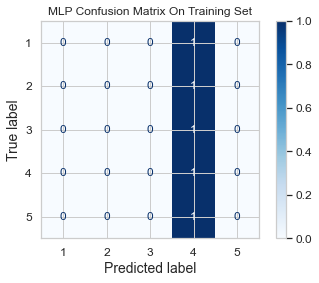

In [159]:
disp = plot_confusion_matrix(mlp_classifier, train_set, train_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("MLP Confusion Matrix On Training Set")
save_fig("MLPConfusionMatrixTR", False)

In [160]:
print_metrics(train_labels, mlp_train_pred)

Accuracy: 0.7492218763895064 

Precision: 0.8121115436711065 

Recall: 0.7492218763895064 

F1-Score: 0.6418092840449


In [161]:
metrics_train_df.loc['MLP'] = get_metrics(train_labels, mlp_train_pred)

Vediamo sul test set:

In [162]:
mlp_test_pred = mlp_classifier.predict(test_set)

Saving figure MLPConfusionMatrixTE


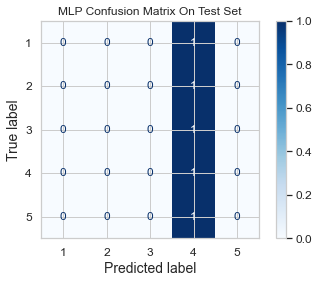

In [163]:
disp = plot_confusion_matrix(mlp_classifier, test_set, test_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("MLP Confusion Matrix On Test Set")
save_fig("MLPConfusionMatrixTE", False)

In [164]:
print_metrics(test_labels, mlp_test_pred)

Accuracy: 0.7486168741355463 

Precision: 0.8118103501049301 

Recall: 0.7486168741355463 

F1-Score: 0.6409948714666632


In [165]:
metrics_test_df.loc['MLP'] = get_metrics(test_labels, mlp_test_pred)

Proviamo a migliorare i risultati dell'MLP Classifier facendo "Parameter Tuning"

In [166]:
mlp_param = { 'learning_rate': ['constant', 'invscaling', 'adaptive'],
                  'solver': ['lbfgs', 'sgd'],
                  'hidden_layer_sizes': [10, 25, 50, 100,200]
                }               
if not checkpoint_exists("bestMLP.sa"):
  mlp_grid_search = GridSearchCV(mlp_classifier, mlp_param, cv=10,scoring='accuracy', return_train_score=True, verbose=1, n_jobs=-1)
  mlp_grid_search.fit(train_set, train_labels)
  best_mlp = mlp_grid_search.best_estimator_
  save_checkpoint(best_mlp, "bestMLP.sa")
else:
  best_mlp = load_checkpoint("bestMLP.sa")

In [167]:
mlp_classifier = best_mlp
mlp_classifier.fit(train_set, train_labels)

MLPClassifier(hidden_layer_sizes=10, solver='sgd')

In [168]:
best_mlp_train_pred = mlp_classifier.predict(train_set)

Saving figure BestMLPConfusionMatrixTE


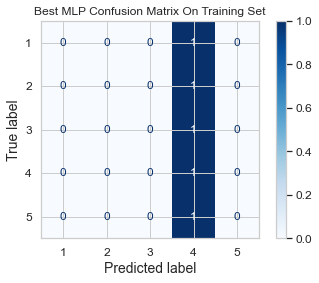

In [169]:
disp = plot_confusion_matrix(mlp_classifier, train_set, train_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Best MLP Confusion Matrix On Training Set")
save_fig("BestMLPConfusionMatrixTE", False)

In [170]:
print_metrics(train_labels, best_mlp_train_pred)

Accuracy: 0.7492218763895064 

Precision: 0.8121115436711065 

Recall: 0.7492218763895064 

F1-Score: 0.6418092840449


In [171]:
metrics_train_df.loc['Best_MLP'] = get_metrics(train_labels, best_mlp_train_pred)

Vediamo cosa cambia con il test set:

In [172]:
best_mlp_test_pred = mlp_classifier.predict(test_set)

Saving figure BestMLPConfusionMatrixTE


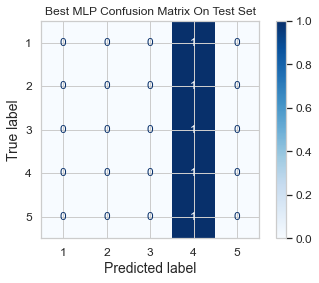

In [173]:
disp = plot_confusion_matrix(mlp_classifier, test_set, test_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Best MLP Confusion Matrix On Test Set")
save_fig("BestMLPConfusionMatrixTE", False)

In [174]:
print_metrics(test_labels, best_mlp_test_pred)

Accuracy: 0.7486168741355463 

Precision: 0.8118103501049301 

Recall: 0.7486168741355463 

F1-Score: 0.6409948714666632


In [175]:
metrics_test_df.loc['Best_MLP'] = get_metrics(test_labels, best_mlp_test_pred)

## Confronto Classificatori

In [176]:
def generate_comparison_dataframe(df):
    values_ = df.values.reshape(df.size,1)
    result = pd.DataFrame(columns=['Name', 'Values', 'Metric'])
    classifiers_ = df.index
    metrics_ = df.columns
    index = 0
    for name in classifiers_:
        for metric in metrics_:
            result.loc[index] = [name + '_' + metric, values_[index][0], metric]
            index = index + 1
    return result 

In [177]:
result = generate_comparison_dataframe(metrics_train_df)

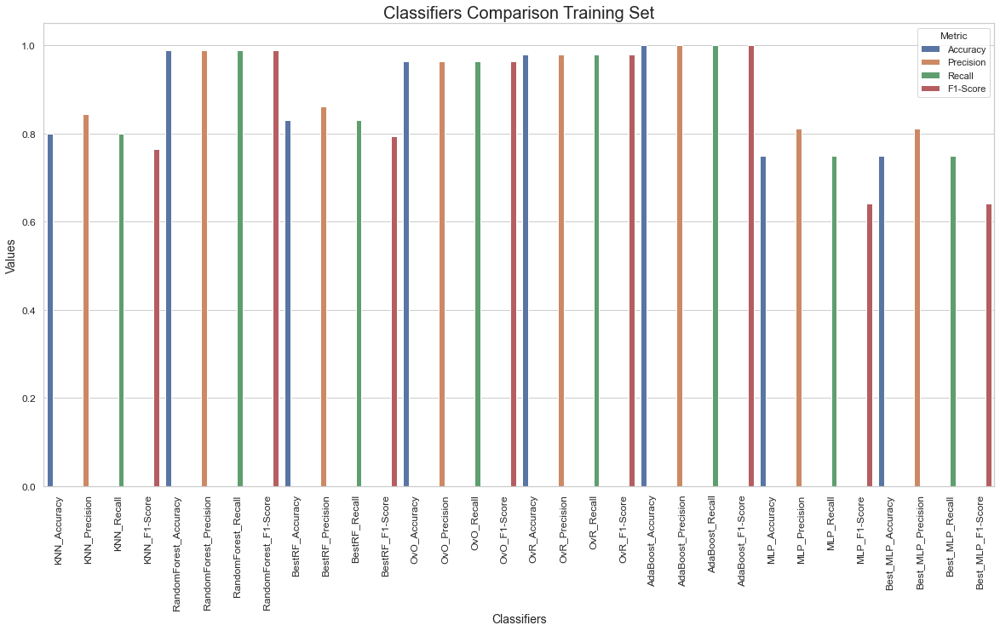

Saving figure ClassifiersComparisonTR


<Figure size 432x288 with 0 Axes>

In [178]:
plt.figure(figsize=(20, 10))
fig = sns.barplot(x='Name', y='Values', data=result, hue='Metric', errwidth=5)
plt.xticks(rotation=90)
plt.ylabel('Values')
plt.xlabel('Classifiers')
plt.title('Classifiers Comparison Training Set', size=20)
plt.show()
save_fig("ClassifiersComparisonTR", False)

In [179]:
result = generate_comparison_dataframe(metrics_test_df)

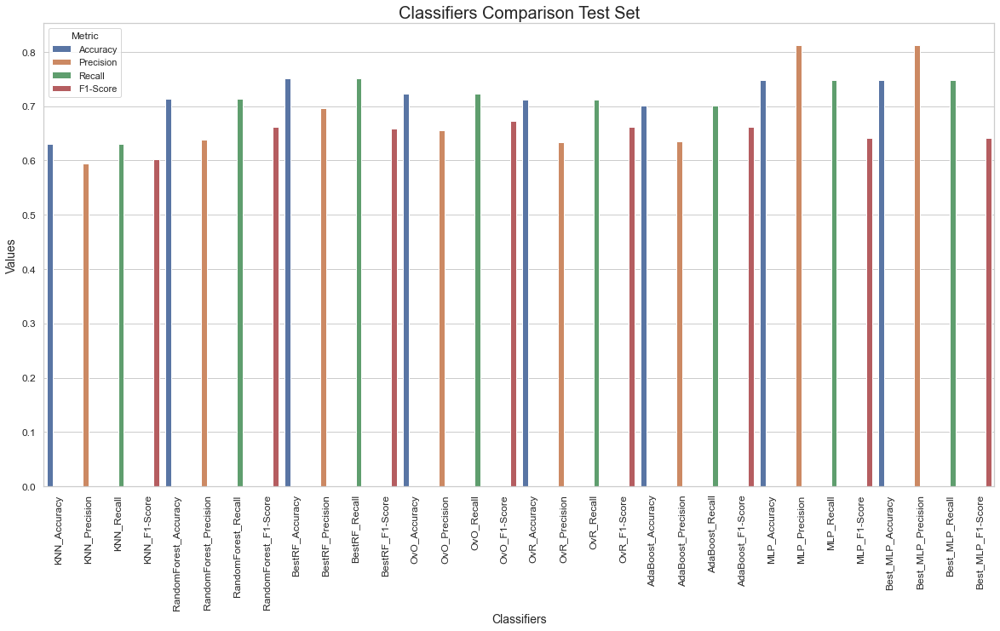

Saving figure ClassifiersComparisonTE


<Figure size 432x288 with 0 Axes>

In [180]:
plt.figure(figsize=(20, 10))
fig = sns.barplot(x='Name', y='Values', data=result, hue='Metric', errwidth=5)
plt.xticks(rotation=90)
plt.ylabel('Values')
plt.xlabel('Classifiers')
plt.title('Classifiers Comparison Test Set', size=20)
plt.show()
save_fig("ClassifiersComparisonTE", False)

Dai risultati ottenuti è chiaro che l'eccessivo sbilanciamento del dataset rende poco efficaci tutti i classificatori sul test set, in particolare l'MLP Classifier risulta avere gli score peggiori.

Seppur i valori di accuracy, precision, recall ed f1-score degli altri classificatori non siano bassi, questo è dovuto al fatto che classificare tutto di classe 4 rende tali valori elevati.

Per dimostrarlo creiamo il classificatore dummy che classifichi ogni elemento come appartenente alla classe 4:

In [181]:
class DummyClassifier(BaseEstimator):
    def fit(self, X, y=None):
        pass
    def predict(self, X):
        return np.array([4] * len(X))

In [182]:
dummy_classifier = DummyClassifier()
dummy_classifier.fit(train_set, train_labels)
dummy_train_pred = dummy_classifier.predict(train_set)

In [183]:
print_metrics(train_labels, dummy_train_pred)

Accuracy: 0.7492218763895064 

Precision: 0.8121115436711065 

Recall: 0.7492218763895064 

F1-Score: 0.6418092840449


Già solo dalla classificicazione del training set con il DummyClassifier si può confermare quanto detto: i valori elevati delle varie metriche sono dovuti al forte sbilanciamento.

# Bilanciamento Dataset

In questa sezione si applicherà una tecnica di bilanciamento, nota come SMOTE Imbalanced, fornita dalla libreria _imbalanced-learn_, al fine di cercare di mitigare l'eccessivo sbilanciamento del dataset.

L'acronico SMOTE sta per "Synthetic Minority Oversampling Technique" e di fatto non fa altro che sintetizzare nuovi record per le classi minoritarie. 

In [184]:
smote_train_set = SMOTE()
train_set, train_labels = smote_train_set.fit_resample(train_set, train_labels)

In [185]:
smote_test_set = SMOTE()
test_set, test_labels = smote_test_set.fit_resample(test_set, test_labels)

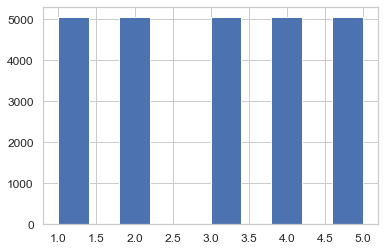

In [186]:
train_labels.hist()

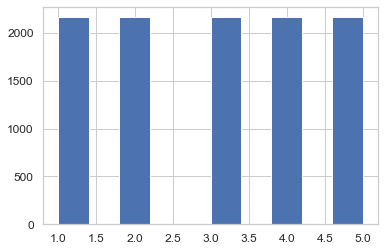

In [187]:
test_labels.hist()

A questo punto, dopo aver plottato la distribuzione delle varie classi sia per il training set sia per il test set, possiamo vedere come ora il dataset sia perfettamente bilanciato.

Procediamo applicando tutti le precedenti tecniche a questi nuovi dati.

****

# Classificazione

In [188]:
metrics_train_df = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1-Score'])
metrics_test_df = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1-Score'])

## KNN Classifier

In [189]:
knn_classifier = KNeighborsClassifier(weights='uniform', leaf_size=30)

Valutiamo l'andamento delle prestazioni al variare del parametro k:

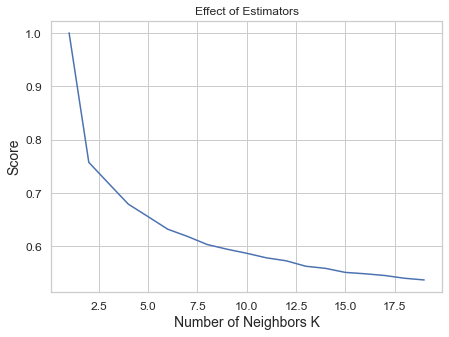

In [190]:
n_neighbors = np.arange(1, 20, 1)
scores = []
for n in n_neighbors:
    knn_classifier.set_params(n_neighbors=n)
    knn_classifier.fit(train_set, train_labels)
    scores.append(knn_classifier.score(train_set, train_labels))
plt.figure(figsize=(7, 5))
plt.title("Effect of Estimators")
plt.xlabel("Number of Neighbors K")
plt.ylabel("Score")
plt.plot(n_neighbors, scores)

Confrontando tale grafico con quello che si otteneva precedentemente sul training set sbilanciato, si può notare che la curva risulta assumere valori maggiori punto per punto, a conferma che ci sono dei miglioramenti.

Scegliamo di usare k=2 che auspicabilmente ci restituirà risultati migliori.

In [191]:
knn_classifier.set_params(n_neighbors=2)
knn_classifier.fit(train_set, train_labels)

KNeighborsClassifier(n_neighbors=2)

In [192]:
knn_train_pred = knn_classifier.predict(train_set)

Saving figure KnnConfusionMatrixBalancedTR


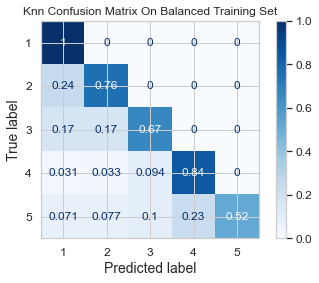

In [193]:
disp = plot_confusion_matrix(knn_classifier, train_set, train_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Knn Confusion Matrix On Balanced Training Set")
save_fig("KnnConfusionMatrixBalancedTR", False)

In [194]:
print_metrics(train_labels, knn_train_pred)

Accuracy: 0.7574678536102868 

Precision: 0.7907332527811759 

Recall: 0.7574678536102868 

F1-Score: 0.751094886826594


Facendo un confronto con la matrice di confusione ottenuta applicando il Knn al training set non bilanciato si può notare come i valori delle varie metriche siano inferiori in questo caso: nonostante ciò, la matrice di confusione riporta notevoli miglioramenti sulla classificazione di tutte le altre classi.

In [195]:
metrics_train_df.loc['KNN'] = get_metrics(train_labels, knn_train_pred)

Applichiamo il Knn Classifier al test set.

In [196]:
knn_test_pred = knn_classifier.predict(test_set)

Saving figure KnnConfusionMatrixBalancedTE


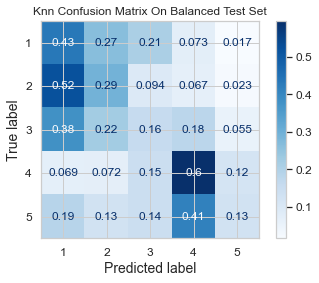

In [197]:
disp = plot_confusion_matrix(knn_classifier, test_set, test_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Knn Confusion Matrix On Balanced Test Set")
save_fig("KnnConfusionMatrixBalancedTE", False)

In [198]:
print_metrics(test_labels, knn_test_pred)

Accuracy: 0.32212471131639725 

Precision: 0.3212435838625771 

Recall: 0.32212471131639725 

F1-Score: 0.30290065478265527


In [199]:
metrics_test_df.loc['KNN'] = get_metrics(test_labels, knn_test_pred)

I valori riportati siano piuttosto bassi, ciò ci indica che tale classificatore non ha delle buone prestazioni sul dataset.

## Random Forest Classifier

In [200]:
random_forest_classifier = RandomForestClassifier(n_estimators=20, random_state=13)

In [201]:
random_forest_classifier.fit(train_set, train_labels)
rf_train_pred = random_forest_classifier.predict(train_set)

Saving figure RFConfusionMatrixBalancedTR


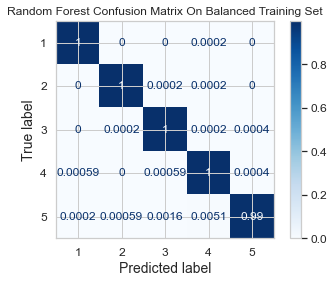

In [202]:
disp = plot_confusion_matrix(random_forest_classifier, train_set, train_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Random Forest Confusion Matrix On Balanced Training Set")
save_fig("RFConfusionMatrixBalancedTR", False)

Anche in questo caso le prestazioni sul training set sono migliorate nonostante fossero molto buone anche nel caso precedente.

In [203]:
print_metrics(train_labels, rf_train_pred)

Accuracy: 0.9979030662710188 

Precision: 0.9979076480971962 

Recall: 0.9979030662710188 

F1-Score: 0.9979020829486748


In [204]:
metrics_train_df.loc['RandomForest'] = get_metrics(train_labels, rf_train_pred)

Valori così elevati ci suggeriscono la presenza di overfitting, che potrà essere confermata o meno applicando tale classificatore al test set.

In [205]:
rf_test_pred = random_forest_classifier.predict(test_set)

Saving figure RFConfusionMatrixBalancedTE


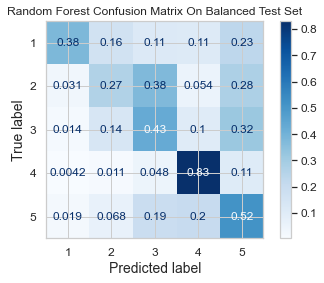

In [206]:
disp = plot_confusion_matrix(random_forest_classifier, test_set, test_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Random Forest Confusion Matrix On Balanced Test Set")
save_fig("RFConfusionMatrixBalancedTE", False)

In [207]:
print_metrics(test_labels, rf_test_pred)

Accuracy: 0.483972286374134 

Precision: 0.5247462312235625 

Recall: 0.483972286374134 

F1-Score: 0.4775021629892416


In [208]:
metrics_test_df.loc['RandomForest'] = get_metrics(test_labels, rf_test_pred)

Si può dedurre che nell'addestramento, il Random Forest soffre di _Overfitting_.

Anche in questo caso, cerchiamo di ottenere dei valori migliori facendo del "Parameter Tuning".

In [209]:
n_estimators = [int(x) for x in np.linspace(start = 50, stop = 500, num = 10)]

max_features = ['auto', 'sqrt', 'log2']

max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

min_samples_split = [2, 5, 10]

min_samples_leaf = [1, 2, 4]

bootstrap = [True, False]

criterion = ['gini', 'entropy']


random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [210]:
if not checkpoint_exists("bestRandomForestBalanced.sa"):
    gridF = GridSearchCV(random_forest_classifier, random_grid, cv = 3, verbose = 1, n_jobs = -1)
    gridF.fit(train_set, train_labels)
    bestF = gridF.best_estimator_
    save_checkpoint(bestF, "bestRandomForestBalanced.sa")
else:
    bestF = load_checkpoint("bestRandomForestBalanced.sa")

In [211]:
bestF.fit(train_set, train_labels)
bestF_train_pred = bestF.predict(train_set)

Saving figure BestRFConfusionMatrixBalancedTR


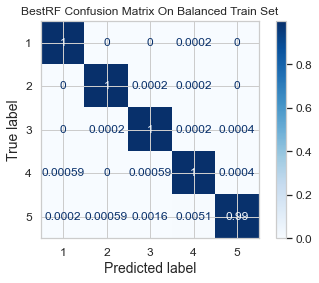

In [212]:
disp = plot_confusion_matrix(random_forest_classifier, train_set, train_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("BestRF Confusion Matrix On Balanced Train Set")
save_fig("BestRFConfusionMatrixBalancedTR", False)

In [213]:
print_metrics(train_labels, bestF_train_pred)

Accuracy: 0.9984965380811078 

Precision: 0.9984989290574671 

Recall: 0.9984965380811078 

F1-Score: 0.9984968882978973


In [214]:
metrics_train_df.loc['BestRF'] = get_metrics(train_labels, bestF_train_pred)

In [215]:
bestF_test_pred = bestF.predict(test_set)

Saving figure BestRFConfusionMatrixBalancedTE


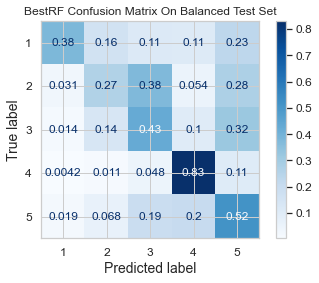

In [216]:
disp = plot_confusion_matrix(random_forest_classifier, test_set, test_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("BestRF Confusion Matrix On Balanced Test Set")
save_fig("BestRFConfusionMatrixBalancedTE", False)

In [217]:
print_metrics(test_labels, bestF_test_pred)

Accuracy: 0.4894226327944573 

Precision: 0.5331904582127595 

Recall: 0.4894226327944573 

F1-Score: 0.4813471778869747


In [218]:
metrics_test_df.loc['BestRF'] = get_metrics(test_labels, bestF_test_pred)

Anche se di poco, con il parameter tuning siamo riusciti a migliorare le performance del Random Forest sul training set, ma il modello riuslta andare maggiormente in overfitting e quindi otteniamo risultati peggiori sul test set.

Un altro tentativo che per tentare di migliorare le performance è usare un importante parametro che il Random Forest ci mette a disposizione: "feature\_importances\_".

In [219]:
columns = train_set.columns.values

In [220]:
feature_importances_b = random_forest_classifier.feature_importances_

In [221]:
importances_df_b = pd.DataFrame(columns=['column', 'feature_importance'])
i = 0
for name, importance in zip(columns, feature_importances_b):
    importances_df_b.loc[i] = [name,importance]
    i = i + 1

Ordiniamo le colonne in base all'importanza:

In [222]:
top_15 = importances_df_b.sort_values(by=['feature_importance'], ascending=False)[:15]

In [223]:
top_15_features = top_15.loc[top_15.index]['column'].values
top_15_features

array(['Reviews', 'Last Updated', 'Size_0', 'Android Ver', 'Size_1',
       'Price', 'CR_Everyone', 'CAT_FAMILY', 'Size_2', 'CAT_TOOLS',
       'CR_Teen', 'CAT_GAME', 'Size_3', 'CAT_BUSINESS',
       'CAT_PERSONALIZATION'], dtype=object)

In [224]:
train_top_15 = train_set[top_15_features]
train_top_15

,Reviews,Last Updated,Size_0,Android Ver,Size_1,Price,CR_Everyone,CAT_FAMILY,Size_2,CAT_TOOLS,CR_Teen,CAT_GAME,Size_3,CAT_BUSINESS,CAT_PERSONALIZATION
0,655,1.463522e+09,1.000000,4,0.000000,0.000000,0,0,0.000000,0,1,1,0.000000,0,0
1,29551,1.522966e+09,0.000000,4,0.000000,0.000000,1,0,0.000000,0,0,0,1.000000,0,0
2,70404,1.527199e+09,1.000000,4,0.000000,0.000000,1,0,0.000000,1,0,0,0.000000,0,0
3,3908,1.531087e+09,0.000000,4,1.000000,0.000000,1,0,0.000000,0,0,0,0.000000,0,0
4,26,1.529878e+09,1.000000,4,0.000000,0.000000,0,0,0.000000,0,1,0,0.000000,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25270,4,1.522623e+09,0.963902,4,0.000000,0.000000,1,0,0.036098,0,0,0,0.000000,0,0
25271,314,1.524002e+09,0.985151,4,0.000000,0.074097,1,0,0.014849,0,0,0,0.000000,0,0
25272,46,1.470908e+09,1.000000,2,0.000000,0.000000,1,0,0.000000,0,0,0,0.000000,0,0
25273,19948,1.531433e+09,0.000000,4,0.028014,0.000000,0,0,0.000000,0,0,0,0.971986,0,0


In [225]:
test_top_15 = test_set[top_15_features]
test_top_15

,Reviews,Last Updated,Size_0,Android Ver,Size_1,Price,CR_Everyone,CAT_FAMILY,Size_2,CAT_TOOLS,CR_Teen,CAT_GAME,Size_3,CAT_BUSINESS,CAT_PERSONALIZATION
0,470,1.520809e+09,0.000000,2,1.000000,0.000000,1,0,0.000000,0,0,0,0.0,0,0
1,38098,1.529532e+09,1.000000,4,0.000000,0.000000,1,0,0.000000,0,0,0,0.0,0,0
2,463,1.522879e+09,1.000000,4,0.000000,0.000000,1,0,0.000000,0,0,0,0.0,0,0
3,4751,1.530310e+09,0.000000,4,1.000000,0.000000,0,0,0.000000,0,1,0,0.0,0,0
4,25,1.516316e+09,1.000000,4,0.000000,0.000000,1,0,0.000000,0,0,0,0.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10820,536,1.525861e+09,1.000000,4,0.000000,0.000000,1,0,0.000000,0,0,0,0.0,0,0
10821,9624,1.491952e+09,0.065227,2,0.934773,4.664518,1,0,0.000000,0,0,0,0.0,0,0
10822,42,1.500753e+09,1.000000,4,0.000000,0.000000,0,0,0.000000,0,1,0,0.0,0,0
10823,7,1.437145e+09,1.000000,2,0.000000,0.948869,0,0,0.000000,0,0,0,0.0,0,0


In [226]:
random_forest_classifier.fit(train_top_15, train_labels)
rf_top15_train_pred = random_forest_classifier.predict(train_top_15)

Saving figure RFConfusionMatrixBalancedTop15TR


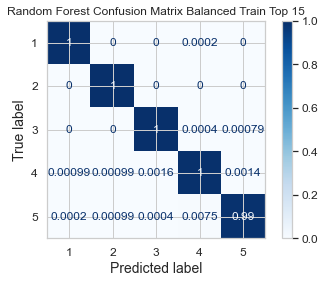

In [227]:
disp = plot_confusion_matrix(random_forest_classifier, train_top_15, train_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Random Forest Confusion Matrix Balanced Train Top 15")
save_fig("RFConfusionMatrixBalancedTop15TR", False)

In [228]:
rf_top15_test_pred = random_forest_classifier.predict(test_top_15)

In [229]:
print_metrics(train_labels, rf_top15_train_pred)

Accuracy: 0.9969139465875371 

Precision: 0.9969173589993662 

Recall: 0.9969139465875371 

F1-Score: 0.9969124815153515


Saving figure RFConfusionMatrixBalancedTop15TE


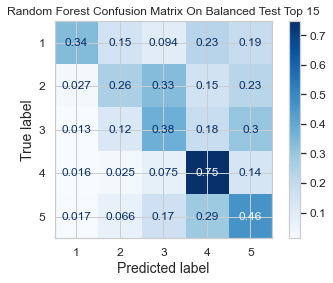

In [230]:
disp = plot_confusion_matrix(random_forest_classifier, test_top_15, test_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Random Forest Confusion Matrix On Balanced Test Top 15")
save_fig("RFConfusionMatrixBalancedTop15TE", False)

In [231]:
print_metrics(test_labels, rf_top15_test_pred)

Accuracy: 0.4372286374133949 

Precision: 0.4838642964191503 

Recall: 0.4372286374133949 

F1-Score: 0.42843638240082615


Anche in questo caso, paghiamo il peso dell'overfitting: infatti, il training set è stato classificato meglio rispetto al caso precedente, ma le metriche del test set sono inferiori (nel test set sbilanciato i record venivano classificati quasi tutti di classe 4).

## One versus One e One versus Rest  

Tentiamo quindi di classificare una volta con la strategia One vs One e poi con la One vs Rest, utilizzando sempre il Random Forest come predittore.

In [232]:
ovo_classifier = OneVsOneClassifier(RandomForestClassifier(n_estimators=10, random_state=13))
ovo_classifier.fit(train_set, train_labels)
ovo_train_pred = ovo_classifier.predict(train_set)

Saving figure OvoConfusionMatrixBalancedTR


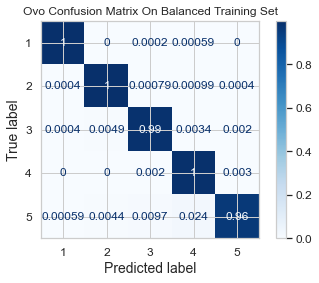

In [233]:
disp = plot_confusion_matrix(ovo_classifier, train_set, train_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Ovo Confusion Matrix On Balanced Training Set")
save_fig("OvoConfusionMatrixBalancedTR", False)

In [234]:
print_metrics(train_labels, ovo_train_pred)

Accuracy: 0.9884470820969338 

Precision: 0.9885647792477428 

Recall: 0.9884470820969338 

F1-Score: 0.9884190053743805


In [235]:
metrics_train_df.loc['OvO'] = get_metrics(train_labels, ovo_train_pred)

Usiamolo sul test set:

In [236]:
ovo_test_pred = ovo_classifier.predict(test_set)

Saving figure OvoConfusionMatrixBalancedTE


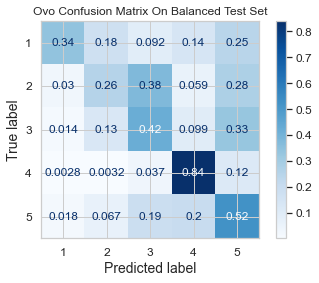

In [237]:
disp = plot_confusion_matrix(ovo_classifier, test_set, test_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Ovo Confusion Matrix On Balanced Test Set")
save_fig("OvoConfusionMatrixBalancedTE", False)

In [238]:
print_metrics(test_labels, ovo_test_pred)

Accuracy: 0.47750577367205543 

Precision: 0.5203887848815403 

Recall: 0.47750577367205543 

F1-Score: 0.4675688014600521


In [239]:
metrics_test_df.loc['OvO'] = get_metrics(test_labels, ovo_test_pred)

In [240]:
ovr_classifier = OneVsRestClassifier(RandomForestClassifier(n_estimators=10, random_state=13))
ovr_classifier.fit(train_set, train_labels)
ovr_train_pred = ovr_classifier.predict(train_set)

Saving figure OvrConfusionMatrixBalancedTR


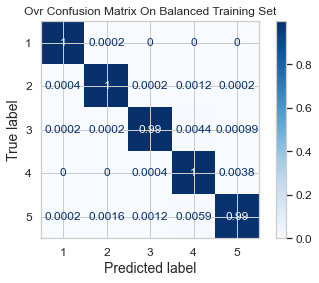

In [241]:
disp = plot_confusion_matrix(ovr_classifier, train_set, train_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Ovr Confusion Matrix On Balanced Training Set")
save_fig("OvrConfusionMatrixBalancedTR", False)

In [242]:
print_metrics(train_labels, ovr_train_pred)

Accuracy: 0.9958061325420375 

Precision: 0.9958175573992532 

Recall: 0.9958061325420375 

F1-Score: 0.9958076256248765


In [243]:
metrics_train_df.loc['OvR'] = get_metrics(train_labels, ovr_train_pred)

Usiamolo sul test set:

In [244]:
ovr_test_pred = ovr_classifier.predict(test_set)

Saving figure OvrConfusionMatrixBalancedTE


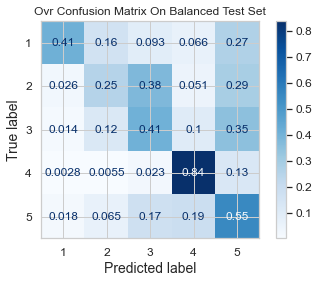

In [245]:
disp = plot_confusion_matrix(ovr_classifier, test_set, test_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Ovr Confusion Matrix On Balanced Test Set")
save_fig("OvrConfusionMatrixBalancedTE", False)

In [246]:
print_metrics(test_labels, ovr_test_pred)

Accuracy: 0.4938568129330254 

Precision: 0.5383059522073543 

Recall: 0.4938568129330254 

F1-Score: 0.488928017653822


In [247]:
metrics_test_df.loc['OvR'] = get_metrics(test_labels, ovr_test_pred)

Mettiamo le due tecniche a confronto

In [248]:
accuracyOVO, precisionOVO, recallOVO, f1_scoreOVO = get_metrics(train_labels, ovo_train_pred)
accuracyOVR, precisionOVR, recallOVR, f1_scoreOVR = get_metrics(train_labels, ovr_train_pred)
accuracyOVO_test, precisionOVO_test, recallOVO_test, f1_scoreOVO_test = get_metrics(test_labels, ovo_test_pred)
accuracyOVR_test, precisionOVR_test, recallOVR_test, f1_scoreOVR_test = get_metrics(test_labels, ovr_test_pred)
values = np.array([accuracyOVO, precisionOVO, recallOVO, f1_scoreOVO, accuracyOVO_test, precisionOVO_test, recallOVO_test, f1_scoreOVO_test, accuracyOVR, precisionOVR, recallOVR, f1_scoreOVR, accuracyOVR_test, precisionOVR_test, recallOVR_test, f1_scoreOVR_test])
df = pd.DataFrame(values.reshape(4,4), index=['OVO_train', 'OVO_test', 'OVR_train', 'OVR_test'], columns=['accuracy', 'precision', 'recall', 'f1-score'])
df

,accuracy,precision,recall,f1-score
OVO_train,0.988447,0.988565,0.988447,0.988419
OVO_test,0.477506,0.520389,0.477506,0.467569
OVR_train,0.995806,0.995818,0.995806,0.995808
OVR_test,0.493857,0.538306,0.493857,0.488928


In tutte le misure risulta superiore il "One vs Rest" sia per quanto concerne il training set e sia per il test set.

## AdaBoost Classifier

In [249]:
decision_tree_classifier = DecisionTreeClassifier()

In [250]:
adaboost_classifier = AdaBoostClassifier(base_estimator=decision_tree_classifier, n_estimators=100, algorithm="SAMME.R", learning_rate=0.5,random_state=13)

In [251]:
adaboost_classifier.fit(train_set, train_labels)
adaboost_train_pred = adaboost_classifier.predict(train_set)

Saving figure AdaBoostConfusionMatrixBalancedTR


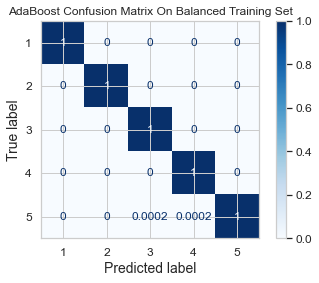

In [252]:
disp = plot_confusion_matrix(adaboost_classifier, train_set, train_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("AdaBoost Confusion Matrix On Balanced Training Set")
save_fig("AdaBoostConfusionMatrixBalancedTR", False)

In [253]:
print_metrics(train_labels, adaboost_train_pred)

Accuracy: 0.9999208704253215 

Precision: 0.9999208860759494 

Recall: 0.9999208704253215 

F1-Score: 0.9999208665099548


In [254]:
metrics_train_df.loc['AdaBoost'] = get_metrics(train_labels, adaboost_train_pred)

Trovare il 100% in tutte le metriche indica la presenza di overfitting nel modello, proprio come era stato scoperto in fase di classificazione del dataset sbilanciato.

Vediamo cosa accade con il test set:

In [255]:
adaboost_test_pred = adaboost_classifier.predict(test_set)

Saving figure AdaBoostConfusionMatrixBalancedTE


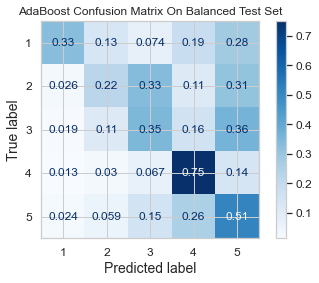

In [256]:
disp = plot_confusion_matrix(adaboost_classifier, test_set, test_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("AdaBoost Confusion Matrix On Balanced Test Set")
save_fig("AdaBoostConfusionMatrixBalancedTE", False)

In [257]:
print_metrics(test_labels, adaboost_test_pred)

Accuracy: 0.43214780600461894 

Precision: 0.4781809608368268 

Recall: 0.43214780600461894 

F1-Score: 0.4215639668787289


In [258]:
metrics_test_df.loc['AdaBoost'] = get_metrics(test_labels, adaboost_test_pred)

## MLP

In [259]:
mlp_classifier = MLPClassifier(learning_rate='adaptive')
mlp_classifier.fit(train_set, train_labels)

MLPClassifier(learning_rate='adaptive')

In [260]:
mlp_train_pred = mlp_classifier.predict(train_set)

Saving figure MLPConfusionMatrixBalancedTR


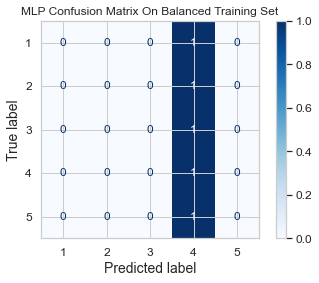

In [261]:
disp = plot_confusion_matrix(mlp_classifier, train_set, train_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("MLP Confusion Matrix On Balanced Training Set")
save_fig("MLPConfusionMatrixBalancedTR", False)

In [262]:
print_metrics(train_labels, mlp_train_pred)

Accuracy: 0.2 

Precision: 0.84 

Recall: 0.2 

F1-Score: 0.06666666666666668


In [263]:
metrics_train_df.loc['MLP'] = get_metrics(train_labels, mlp_train_pred)

Sul training set sbilanciato tutti i record risultavano classificati come aventi Rating pari a 4: qui invece la quasi totalità dei campioni è inserita nella classe 3.

Vediamo sul test set:

In [264]:
mlp_test_pred = mlp_classifier.predict(test_set)

Saving figure MLPConfusionMatrixBalancedTE


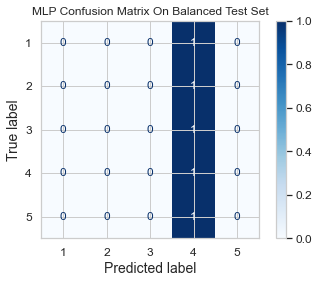

In [265]:
disp = plot_confusion_matrix(mlp_classifier, test_set, test_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("MLP Confusion Matrix On Balanced Test Set")
save_fig("MLPConfusionMatrixBalancedTE", False)

In [266]:
print_metrics(test_labels, mlp_test_pred)

Accuracy: 0.2 

Precision: 0.84 

Recall: 0.2 

F1-Score: 0.06666666666666668


In [267]:
metrics_test_df.loc['MLP'] = get_metrics(test_labels, mlp_test_pred)

Proviamo a migliorare i risultati dell'MLP Classifier facendo "Parameter Tuning"

In [268]:
mlp_param = { 'learning_rate': ['constant', 'invscaling', 'adaptive'],
                  'solver': ['lbfgs', 'sgd'],
                  'hidden_layer_sizes': [10, 25, 50, 100, 200]
                }               
if not checkpoint_exists("bestMLPBalanced.sa"):
  mlp_grid_search = GridSearchCV(mlp_classifier, mlp_param, cv=10,scoring='accuracy', return_train_score=True, verbose=1, n_jobs=-1)
  mlp_grid_search.fit(train_set, train_labels)
  best_mlp = mlp_grid_search.best_estimator_
  save_checkpoint(best_mlp, "bestMLPBalanced.sa")
else:
  best_mlp = load_checkpoint("bestMLPBalanced.sa") 

In [269]:
mlp_classifier = best_mlp
mlp_classifier.fit(train_set, train_labels)

MLPClassifier(hidden_layer_sizes=25, learning_rate='invscaling', solver='lbfgs')

In [270]:
best_mlp_train_pred = mlp_classifier.predict(train_set)

Saving figure BestMLPConfusionMatrixBalancedTR


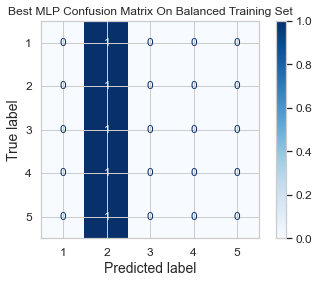

In [271]:
disp = plot_confusion_matrix(mlp_classifier, train_set, train_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Best MLP Confusion Matrix On Balanced Training Set")
save_fig("BestMLPConfusionMatrixBalancedTR", False)

In [272]:
print_metrics(train_labels, best_mlp_train_pred)

Accuracy: 0.2 

Precision: 0.84 

Recall: 0.2 

F1-Score: 0.06666666666666668


In [273]:
metrics_train_df.loc['Best_MLP'] = get_metrics(train_labels, best_mlp_train_pred)

Vediamo cosa cambia con il test set:

In [274]:
best_mlp_test_pred = mlp_classifier.predict(test_set)

Saving figure BestMLPConfusionMatrixBalancedTE


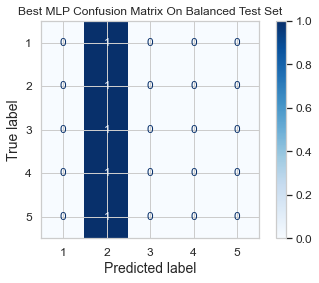

In [275]:
disp = plot_confusion_matrix(mlp_classifier, test_set, test_labels,
                                 display_labels=[1,2,3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')

disp.ax_.set_title("Best MLP Confusion Matrix On Balanced Test Set")
save_fig("BestMLPConfusionMatrixBalancedTE", False)

In [276]:
print_metrics(test_labels, best_mlp_test_pred)

Accuracy: 0.2 

Precision: 0.84 

Recall: 0.2 

F1-Score: 0.06666666666666668


In [277]:
metrics_test_df.loc['Best_MLP'] = get_metrics(test_labels, best_mlp_test_pred)

Il parameter tuning accentua il fenomeno sopra descritto classificando tutti i samples come di classe 2.

## Confronto Classificatori

Confrontiamo tutti i classificatori utilizzati sul dataset bilanciato.

### Training Set

In [278]:
metrics_train_df

,Accuracy,Precision,Recall,F1-Score
KNN,0.757468,0.790733,0.757468,0.751095
RandomForest,0.997903,0.997908,0.997903,0.997902
BestRF,0.998497,0.998499,0.998497,0.998497
OvO,0.988447,0.988565,0.988447,0.988419
OvR,0.995806,0.995818,0.995806,0.995808
AdaBoost,0.999921,0.999921,0.999921,0.999921
MLP,0.200000,0.840000,0.200000,0.066667
Best_MLP,0.200000,0.840000,0.200000,0.066667


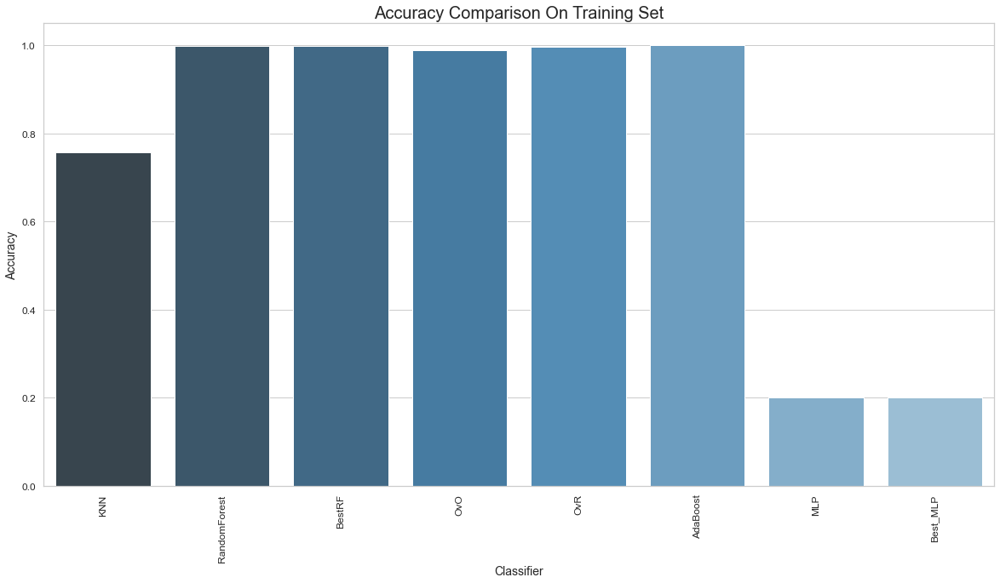

Saving figure AccuracyComparisonTrainingSet


<Figure size 432x288 with 0 Axes>

In [279]:
plt.figure(figsize=(20, 10))
fig = sns.barplot(x=metrics_train_df.index, y=metrics_train_df['Accuracy'], palette='Blues_d')
plt.xticks(rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Classifier')
plt.title('Accuracy Comparison On Training Set', size=20)
plt.show()
save_fig("AccuracyComparisonTrainingSet", False)

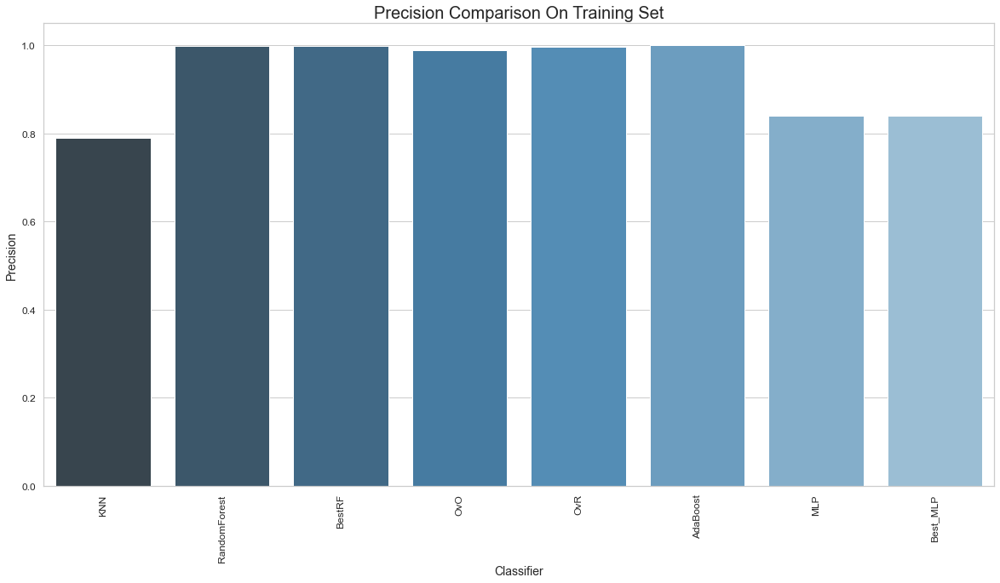

Saving figure PrecisionComparisonTrainingSet


<Figure size 432x288 with 0 Axes>

In [280]:
plt.figure(figsize=(20, 10))
fig = sns.barplot(x=metrics_train_df.index, y=metrics_train_df['Precision'], palette='Blues_d')
plt.xticks(rotation=90)
plt.ylabel('Precision')
plt.xlabel('Classifier')
plt.title('Precision Comparison On Training Set', size=20)
plt.show()
save_fig("PrecisionComparisonTrainingSet", False)

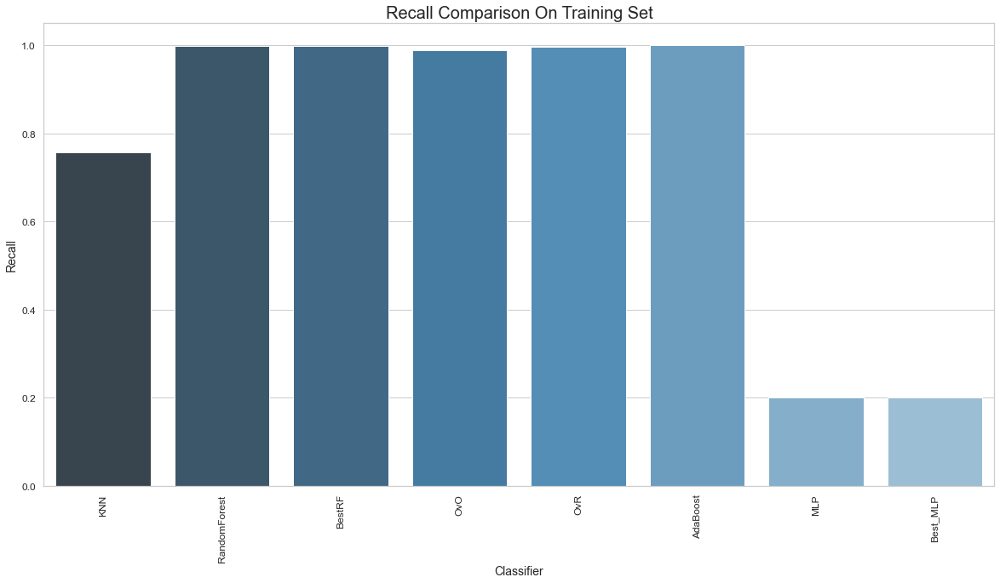

Saving figure RecallComparisonTrainingSet


<Figure size 432x288 with 0 Axes>

In [281]:
plt.figure(figsize=(20, 10))
fig = sns.barplot(x=metrics_train_df.index, y=metrics_train_df['Recall'], palette='Blues_d')
plt.xticks(rotation=90)
plt.ylabel('Recall')
plt.xlabel('Classifier')
plt.title('Recall Comparison On Training Set', size=20)
plt.show()
save_fig("RecallComparisonTrainingSet", False)

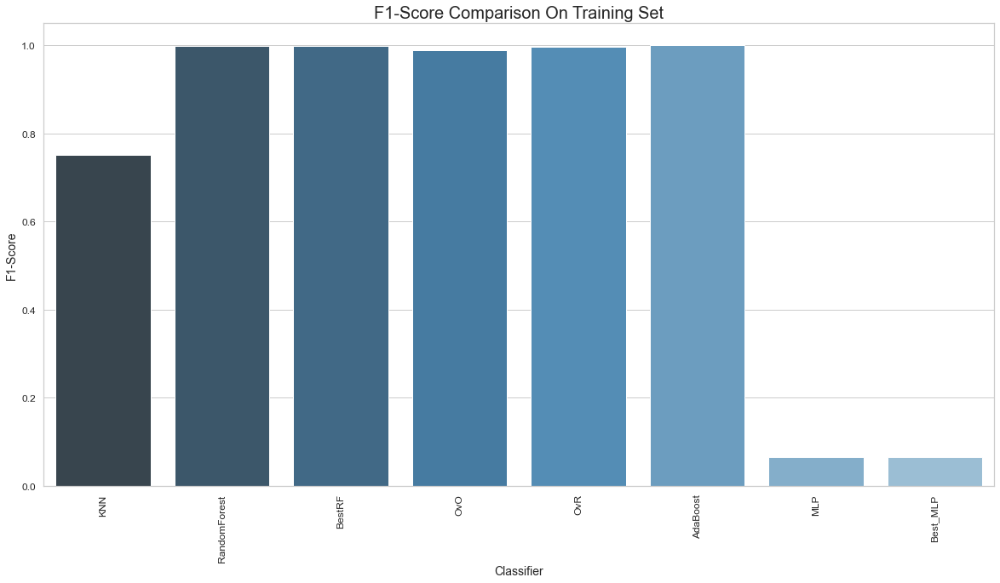

Saving figure F1ScoreComparisonTrainingSet


<Figure size 432x288 with 0 Axes>

In [282]:
plt.figure(figsize=(20, 10))
fig = sns.barplot(x=metrics_train_df.index, y=metrics_train_df['F1-Score'], palette='Blues_d')
plt.xticks(rotation=90)
plt.ylabel('F1-Score')
plt.xlabel('Classifier')
plt.title('F1-Score Comparison On Training Set', size=20)
plt.show()
save_fig("F1ScoreComparisonTrainingSet", False)

Per quanto concerne il training set, vediamo che la maggior parte dei classificatori ottiene eccellenti risultati: l'unico classificatore ad andare davvero male è l'MLPClassifier.

## Test Set

In [283]:
metrics_test_df

,Accuracy,Precision,Recall,F1-Score
KNN,0.322125,0.321244,0.322125,0.302901
RandomForest,0.483972,0.524746,0.483972,0.477502
BestRF,0.489423,0.533190,0.489423,0.481347
OvO,0.477506,0.520389,0.477506,0.467569
OvR,0.493857,0.538306,0.493857,0.488928
AdaBoost,0.432148,0.478181,0.432148,0.421564
MLP,0.200000,0.840000,0.200000,0.066667
Best_MLP,0.200000,0.840000,0.200000,0.066667


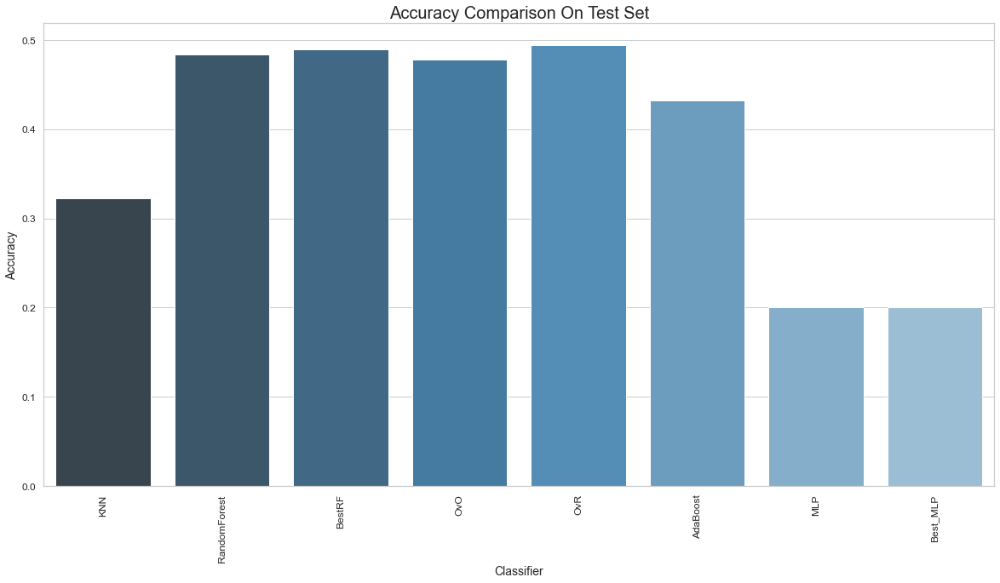

Saving figure AccuracyComparisonTestSet


<Figure size 432x288 with 0 Axes>

In [284]:
plt.figure(figsize=(20, 10))
fig = sns.barplot(x=metrics_test_df.index, y=metrics_test_df['Accuracy'], palette='Blues_d')
plt.xticks(rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Classifier')
plt.title('Accuracy Comparison On Test Set', size=20)
plt.show()
save_fig("AccuracyComparisonTestSet", False)

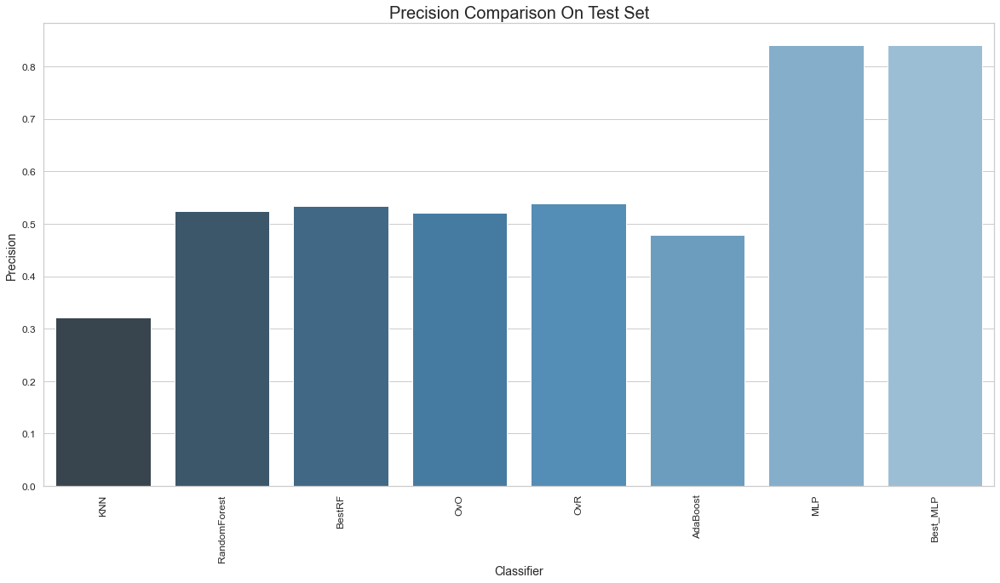

Saving figure PrecisionComparisonTestSet


<Figure size 432x288 with 0 Axes>

In [285]:
plt.figure(figsize=(20, 10))
fig = sns.barplot(x=metrics_test_df.index, y=metrics_test_df['Precision'], palette='Blues_d')
plt.xticks(rotation=90)
plt.ylabel('Precision')
plt.xlabel('Classifier')
plt.title('Precision Comparison On Test Set', size=20)
plt.show()
save_fig("PrecisionComparisonTestSet", False)

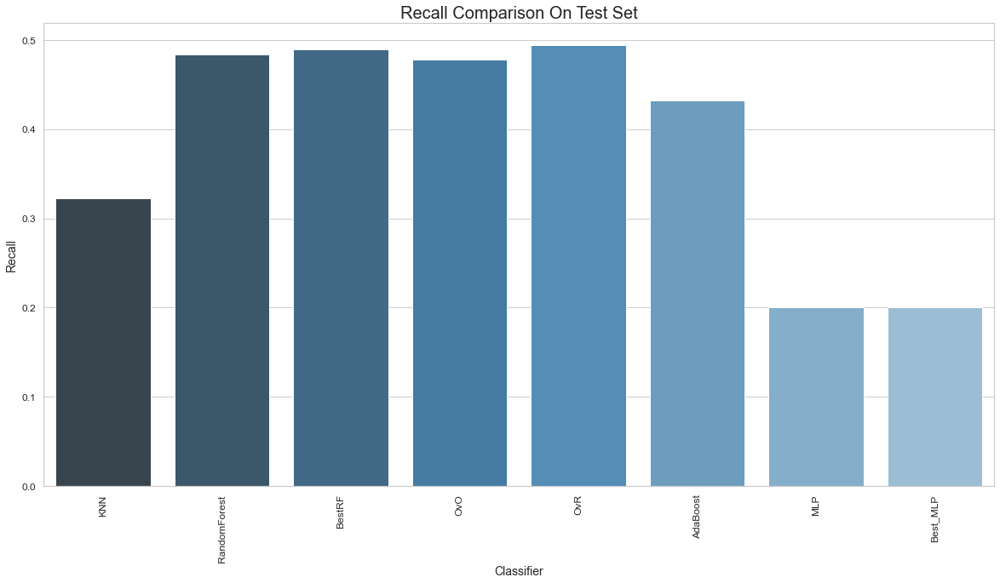

Saving figure RecallComparisonTestSet


<Figure size 432x288 with 0 Axes>

In [286]:
plt.figure(figsize=(20, 10))
fig = sns.barplot(x=metrics_test_df.index, y=metrics_test_df['Recall'], palette='Blues_d')
plt.xticks(rotation=90)
plt.ylabel('Recall')
plt.xlabel('Classifier')
plt.title('Recall Comparison On Test Set', size=20)
plt.show()
save_fig("RecallComparisonTestSet", False)

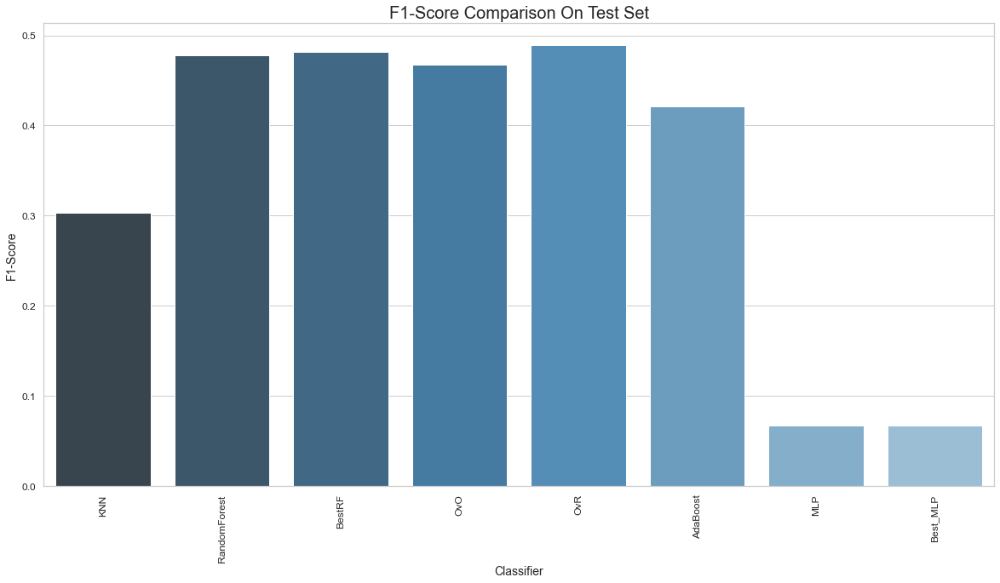

Saving figure F1ScoreComparisonTestSet


<Figure size 432x288 with 0 Axes>

In [287]:
plt.figure(figsize=(20, 10))
fig = sns.barplot(x=metrics_test_df.index, y=metrics_test_df['F1-Score'], palette='Blues_d')
plt.xticks(rotation=90)
plt.ylabel('F1-Score')
plt.xlabel('Classifier')
plt.title('F1-Score Comparison On Test Set', size=20)
plt.show()
save_fig("F1ScoreComparisonTestSet", False)

Dopo i vari plot, possiamo constatare che le performance peggiori sono state senza dubbio quelle dell'MLPClassifier. Invece i valori migliori si ottengono con l'applicazione della strategia One vs Rest al Random Forest Classifier.

Un'ulteriore osservazione è che applicando il GridSearch al Random Forest Classifier (quindi classificando con il BestRandomForest) otteniamo dei miglioramenti. Invece, ciò non accade con l'MLPCLassifier che anche con il il parameter Tuning non ottiene miglioramenti.

****

# Conclusioni

Facciamo un resoconto del progetto così da poter trarre le varie conclusioni.

Il presente lavoro ha l'obiettivo di prevedere l'indice di gradimento di un'app: si immagini di essere stati chiamati da una società di investimenti che deve decidere come investire i propri soldi nel mercato delle app. 

L'indice di gradimento dell'app è un punteggi rilasciato dagli utenti e di valore compreso tra 1 e 5.
Lo scopo della classificazione è quello di predire tale valore sfruttando gli altri attributi presenti: si tratta dunque di una classificazione multiclasse.

Riassumiamo alcune osservazioni che sono scaturite dall’analisi effettuata:   
•	La Categoria di app più diffusa è FAMILY e seguita da GAME e TOOLS;   
•	La gente appare essere maggiormente predisposta a dare punteggi alti alle varie app. Pensiamo però che dietro a tali punteggi così elevati possa esserci la compravendita delle recensioni. E’ infatti noto che numerose agenzie cinesi offrono servizi per l’acquisto di recensioni;   
•	La grande maggioranza delle app è gratuita e pochissime hanno prezzo superiore a $100;   
•	La maggior parte delle app richiede come versione minima di Android la 4.x. Invece, app che richiedono una versione troppo vecchia di Android risultano essere poco scaricate e poco recensite: questo perché un target minimo molto basso è indice di applicazioni obsolete;    
•	Risulta esserci una correlazione tra Reviews e Installs e poi anche tra Android Ver e Last Updated;


## Sbilanciamento Dataset 

Uno dei principali ostacoli incontrati durante la fase di realizzazione è stato l'eccessivo sbilanciamento del nostro dataset. In particolare la stragrande maggioranza dei campioni a nostra disposizione sono di classe 4, mentre le classi 1 e 2 sono estremamente rare.

Come si è potuto constatare dal risultato dell'analisi, tale sbilanciamento ha reso poco efficaci tutti i classificatori (specialmente l'MLP CLassifier) e falsato le metriche di valutazione utilizzate.

Per mitigare questo problema, cercando di fornire un'analisi più accurata e veritiera, si è fatto uso di una tecnica di bilanciamento nota come SMOTE (messa a disposizione dalla libreria imblearn).

Una volta bilanciato il dataset si è nuovamente proceduto ad effettuare la classificazione con gli stessi predittori. I modelli ottenuti si sono rivelati di gran lunga più efficaci: infatti, seppur i valori ottenuti dalle varie misure risultano inferiori, nel dataset sbilanciato tali valori erano dovuto alla predominanza della classe 4 (si veda i valori del DummyClassifier).


## Analisi delle "top features"

Delle considerazioni finali sono doverose per quanto riguarda l'importanza delle feature all'interno del nostro dataset: in fase di classificazione infatti abbiamo utilizzato l'attributo _feature\_importances\_ _ messoci a disposizione del Random Forest per ottenere un quadro generale che ci potesse aiutare a migliorare le predizioni. Ma ciò ci è utile anche per capire di più sui nostri dati.

In [288]:
importances_df.sort_values(by=['feature_importance'], ascending=False)

,column,feature_importance
0,Reviews,0.358020
2,Last Updated,0.328700
3,Android Ver,0.058919
1,Price,0.032221
15,CAT_FAMILY,0.011624
37,Size_0,0.011588
38,Size_1,0.010543
18,CAT_GAME,0.008162
33,CAT_TOOLS,0.008029
48,CR_Everyone,0.008008


Di tale classificazione salta all'occhio che l'attributo Installs (in particolare la sua discretizzazione) si trovi ad occupare le ultime posizioni.   

Da un'ulteriore analisi della matrice di correlazione si evince una forte correlazione con l'attributo Reviews che invece occupa la prima posizione: il perchè deriva dal fatto che tale classificazione è ottenuta tramite il Random Forest che al suo interno utilizza dei Decision Tree: questi sono classificatori robusti rispetto alla presenza di correlazione tra gli attributi. In particolare per evitare che la correlazione falsi i risultati, uno dei due attributi viene ignorato e così è stato tra Reviews e Installs.

Di seguito sono riportate le features, ordinate per importanza, del dataset bilanciato. Si può notare come la posizione dei vari attributi non vari molto rispetto al caso precedente.

In [289]:
importances_df_b.sort_values(by=['feature_importance'], ascending=False)

,column,feature_importance
0,Reviews,0.342819
2,Last Updated,0.267188
37,Size_0,0.049090
3,Android Ver,0.048290
38,Size_1,0.043717
1,Price,0.039122
48,CR_Everyone,0.020872
15,CAT_FAMILY,0.018165
39,Size_2,0.016916
33,CAT_TOOLS,0.011786


# Appendice

Come analisi aggiuntiva si è deciso di integrare un secondo dataset correlato: questo contiene dati relativi alle recensioni degli utenti.

In particolare ci siamo interessati all'attributo Sentiment Polarity: esso rappresenta quanto un'opinione è positiva o negativa.

In [290]:
aux_data = load_dataset("googleplaystore_user_reviews.csv")

In [291]:
aux_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64295 entries, 0 to 64294
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   App                     64295 non-null  object 
 1   Translated_Review       37427 non-null  object 
 2   Sentiment               37432 non-null  object 
 3   Sentiment_Polarity      37432 non-null  float64
 4   Sentiment_Subjectivity  37432 non-null  float64
dtypes: float64(2), object(3)
memory usage: 2.5+ MB


In [292]:
aux_data.head()

,App,Translated_Review,Sentiment,Sentiment_Polarity,Sentiment_Subjectivity
0,10 Best Foods for You,I like eat delicious food. That's I'm cooking ...,Positive,1.00,0.533333
1,10 Best Foods for You,This help eating healthy exercise regular basis,Positive,0.25,0.288462
2,10 Best Foods for You,NaN,NaN,NaN,NaN
3,10 Best Foods for You,Works great especially going grocery store,Positive,0.40,0.875000
4,10 Best Foods for You,Best idea us,Positive,1.00,0.300000


In [293]:
distinct_apps = aux_data.App.unique()

Precederemo integrando nel dataset principale la colonna "Sentiment_Polarity": prima di farlo però è necessario analizzarla e processarla.

In [294]:
aux_data.Sentiment_Polarity[aux_data.Sentiment_Polarity.isna()]

2       NaN
7       NaN
15      NaN
102     NaN
107     NaN
         ..
64290   NaN
64291   NaN
64292   NaN
64293   NaN
64294   NaN
Name: Sentiment_Polarity, Length: 26863, dtype: float64

Vediamo che la colonna presenta dei valori NaN: con un imputer sostituiamo tali valori con la media degli score di Sentiment_Polarity della stessa app.

Verichiamo per prima cosa, app per app il numero di NaN nella colonna "Sentiment_Polarity"

In [295]:
nan_apps_df = pd.DataFrame(columns=['Total Values', 'NaN Values'])

for app in distinct_apps:
    tmp = aux_data[aux_data.App == app]
    nan_apps_df.loc[app] = [tmp.index.size, tmp[tmp.Sentiment_Polarity.isna()].index.size]
    
nan_apps_df

,Total Values,NaN Values
10 Best Foods for You,200,6
104 找工作 - 找工作 找打工 找兼職 履歷健檢 履歷診療室,40,0
11st,40,0
1800 Contacts - Lens Store,80,0
1LINE – One Line with One Touch,40,2
...,...,...
Hotspot Shield Free VPN Proxy & Wi-Fi Security,40,6
Hotstar,40,8
Hotwire Hotel & Car Rental App,40,7
Housing-Real Estate & Property,40,19


Ci sono app per cui tutti i valori di Sentiment Polarity sono NaN, si è dunque deciso di non considerare tali app nella successiva analisi.
  
Per tutti gli altri NaN invece verranno sostituiti con la media dei valori non NaN della stessa app.

In [296]:
for app in nan_apps_df.index:
    if nan_apps_df.loc[app]['Total Values'] == nan_apps_df.loc[app]['NaN Values']:
            aux_data.drop(aux_data[aux_data.App == app].index, inplace=True)



In [297]:
sentiment_imputer = SimpleImputer()

for app in aux_data.App.unique():
    tmp = aux_data[aux_data.App == app]
    tmp['Sentiment_Polarity'] = sentiment_imputer.fit_transform(tmp[['Sentiment_Polarity']])
    aux_data.update(tmp)

In [298]:
mean_sentiment_df = pd.DataFrame(columns=['Mean_Sentiment_Polarity'])

for app in aux_data.App.unique():
    tmp = aux_data[aux_data.App == app]
    mean = tmp.Sentiment_Polarity.mean()
    mean_sentiment_df.loc[app] = mean

mean_sentiment_df

,Mean_Sentiment_Polarity
10 Best Foods for You,0.470733
104 找工作 - 找工作 找打工 找兼職 履歷健檢 履歷診療室,0.392405
11st,0.181294
1800 Contacts - Lens Store,0.318145
1LINE – One Line with One Touch,0.196290
...,...
Hotels.com: Book Hotel Rooms & Find Vacation Deals,0.101622
Hotspot Shield Free VPN Proxy & Wi-Fi Security,0.251765
Hotstar,0.038178
Hotwire Hotel & Car Rental App,0.187029


Nel secondo dataset vi sono informazioni utili relative solo a 865 app (a fronte delle circa 10000 del primo).

Per tale motivo si analizzerà solo questo sottoinsieme di app.

In [299]:
new_data = data_backup[data_backup.App.isin(mean_sentiment_df.index)]

In [300]:
new_data['Sentiment_Polarity'] = 0.0

for app in new_data.App:
    new_data.Sentiment_Polarity[new_data.App == app] = mean_sentiment_df.loc[app].Mean_Sentiment_Polarity

new_data.head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,...,Installs_2,Installs_3,Installs_4,CR_Adults only 18+,CR_Everyone,CR_Everyone 10+,CR_Mature 17+,CR_Teen,CR_Unrated,Sentiment_Polarity
1,Coloring book moana,ART_AND_DESIGN,4,967,14.0,500000,Free,0.0,Everyone,Art & Design;Pretend Play,...,0.0,0.0,0.0,0,1,0,0,0,0,0.152652
8,Garden Coloring Book,ART_AND_DESIGN,4,13791,33.0,1000000,Free,0.0,Everyone,Art & Design,...,0.0,0.0,0.0,0,1,0,0,0,0,0.268483
18,FlipaClip - Cartoon animation,ART_AND_DESIGN,4,194216,39.0,5000000,Free,0.0,Everyone,Art & Design,...,0.0,0.0,0.0,0,1,0,0,0,0,0.412649
21,Boys Photo Editor - Six Pack & Men's Suit,ART_AND_DESIGN,4,654,12.0,100000,Free,0.0,Everyone,Art & Design,...,0.0,0.0,0.0,0,1,0,0,0,0,0.283509
26,Colorfit - Drawing & Coloring,ART_AND_DESIGN,5,20260,25.0,500000,Free,0.0,Everyone,Art & Design;Creativity,...,0.0,0.0,0.0,0,1,0,0,0,0,0.171836


Nel dataframe "new_data" sono presenti tutte le colonne del dataset di partenza più una che contiene  il valore medio di Sentiment_Polarity precedentemente calcolata.

Analizziamo se vi sono correlazione tra questo nuovo attributo e tutti gli altri: ci si aspetta che vi sia un'elevata correlazione con Rating.

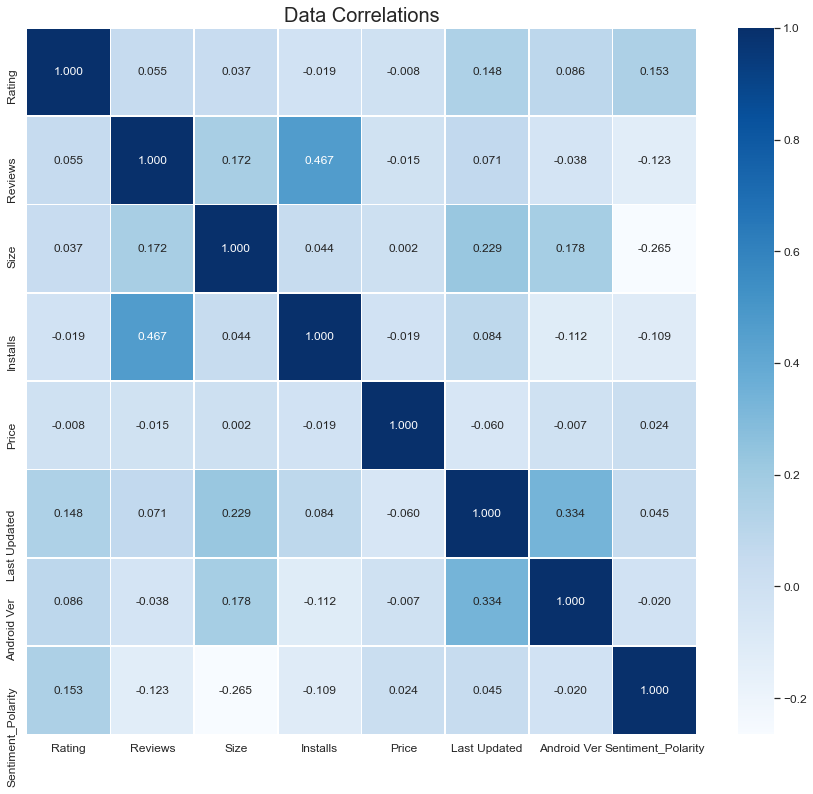

Saving figure DataCorrelations2


<Figure size 432x288 with 0 Axes>

In [301]:
to_plot = new_data[["Rating", "Reviews", "Size", "Installs", "Price", "Last Updated", "Android Ver", "Sentiment_Polarity"]]

fig,ax = plt.subplots(figsize=(15, 13))
fig = sns.heatmap(to_plot.corr(), annot=True, linewidths=.5, fmt='.3f', cmap='Blues')
plt.title("Data Correlations", size=20)
plt.show()
figure = fig.get_figure()
save_fig("DataCorrelations2", False)

La matrice di correlazione non conferma la nostra tesi. Pensiamo sia dovuto alle approssimazioni fatte in fase di preprocessing.

## Classificazione

In [302]:
metrics_train_df = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1-Score'])
metrics_test_df = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1-Score'])

In [303]:
new_data.drop(to_remove, axis=1, inplace=True)

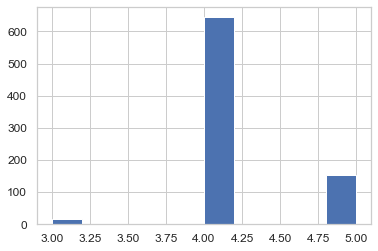

In [304]:
new_data.Rating.hist()

Dall'istogramma risulta un dataset fortemente sbilanciato e delle 5 classi di partenza qui ne sono presenti solo 3.

Nella costruzione di training set e test set utilizzeremo nuovamente lo SMOTE.

## Inizializzazione Training e Test Set

In [305]:
train_set, test_set = train_test_split(new_data, test_size=0.3, random_state=13)

In [306]:
train_labels = train_set["Rating"].copy()
train_set.drop("Rating", axis=1, inplace=True)

In [307]:
test_labels = test_set["Rating"].copy()
test_set.drop("Rating", axis=1, inplace=True)

In [308]:
smote_train_set = SMOTE()
train_set, train_labels = smote_train_set.fit_resample(train_set, train_labels)

In [309]:
smote_test_set = SMOTE()
test_set, test_labels = smote_test_set.fit_resample(test_set, test_labels)

Procederemo a classificare il nuovo dataset solo con i classificatori che hanno avuto delle performance migliori nell'analisi precedente.

## Random Forest Classifier

In [310]:
random_forest_classifier = RandomForestClassifier(n_estimators=20, random_state=13)

In [311]:
random_forest_classifier.fit(train_set, train_labels)
rf_train_pred = random_forest_classifier.predict(train_set)

Saving figure RFConfusionMatrixAppendixTR


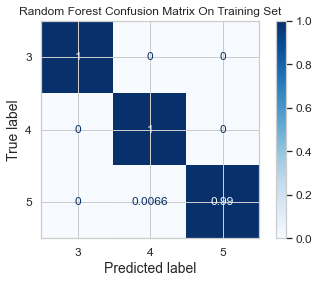

In [312]:
disp = plot_confusion_matrix(random_forest_classifier, train_set, train_labels,
                                 display_labels=[3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')
 
disp.ax_.set_title("Random Forest Confusion Matrix On Training Set")
save_fig("RFConfusionMatrixAppendixTR", False)

In [313]:
print_metrics(train_labels, rf_train_pred)

Accuracy: 0.9978118161925602 

Precision: 0.9978260869565218 

Recall: 0.9978118161925602 

F1-Score: 0.9978117926182715


In [314]:
metrics_train_df.loc['RandomForest'] = get_metrics(train_labels, rf_train_pred)

In [315]:
rf_test_pred = random_forest_classifier.predict(test_set)

Saving figure RFConfusionMatrixAppendixTE


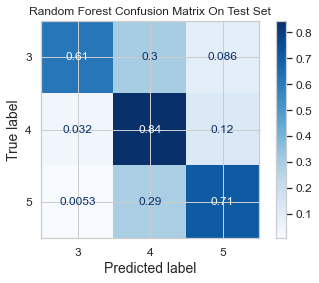

In [316]:
disp = plot_confusion_matrix(random_forest_classifier, test_set, test_labels,
                                 display_labels=[3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')
 
disp.ax_.set_title("Random Forest Confusion Matrix On Test Set")
save_fig("RFConfusionMatrixAppendixTE", False)

In [317]:
print_metrics(test_labels, rf_test_pred)

Accuracy: 0.7219251336898396 

Precision: 0.7680350047290153 

Recall: 0.7219251336898396 

F1-Score: 0.725424077227516


In [318]:
metrics_test_df.loc['RandomForest'] = get_metrics(test_labels, rf_test_pred)

## Adaboost Classifier

In [319]:
decision_tree_classifier = DecisionTreeClassifier()

In [320]:
adaboost_classifier = AdaBoostClassifier(base_estimator=decision_tree_classifier, n_estimators=100, algorithm="SAMME.R", learning_rate=0.5,random_state=13)

In [321]:
adaboost_classifier.fit(train_set, train_labels)
adaboost_train_pred = adaboost_classifier.predict(train_set)

Text(0.5, 1.0, 'AdaBoost Confusion Matrix On Training Set')

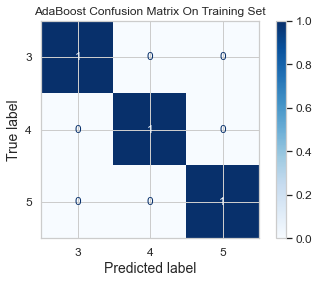

In [322]:
disp = plot_confusion_matrix(adaboost_classifier, train_set, train_labels,
                                 display_labels=[3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')
 
disp.ax_.set_title("AdaBoost Confusion Matrix On Training Set")

In [323]:
print_metrics(train_labels, adaboost_train_pred)

Accuracy: 1.0 

Precision: 1.0 

Recall: 1.0 

F1-Score: 1.0


In [324]:
metrics_train_df.loc['AdaBoost'] = get_metrics(train_labels, adaboost_train_pred)

In [325]:
adaboost_test_pred = adaboost_classifier.predict(test_set)

Saving figure AdaBoostConfusionMatrixTE


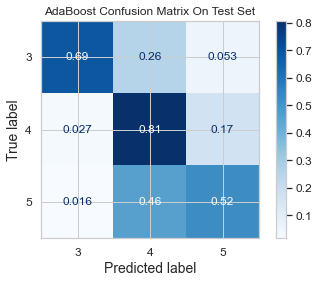

In [326]:
disp = plot_confusion_matrix(adaboost_classifier, test_set, test_labels,
                                 display_labels=[3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')
 
disp.ax_.set_title("AdaBoost Confusion Matrix On Test Set")
save_fig("AdaBoostConfusionMatrixTE", False)

In [327]:
print_metrics(test_labels, adaboost_test_pred)

Accuracy: 0.6737967914438503 

Precision: 0.7254887906808628 

Recall: 0.6737967914438503 

F1-Score: 0.6791179328786343


In [328]:
metrics_test_df.loc['AdaBoost'] = get_metrics(test_labels, adaboost_test_pred)

## Confronto

In [329]:
result = generate_comparison_dataframe(metrics_test_df)

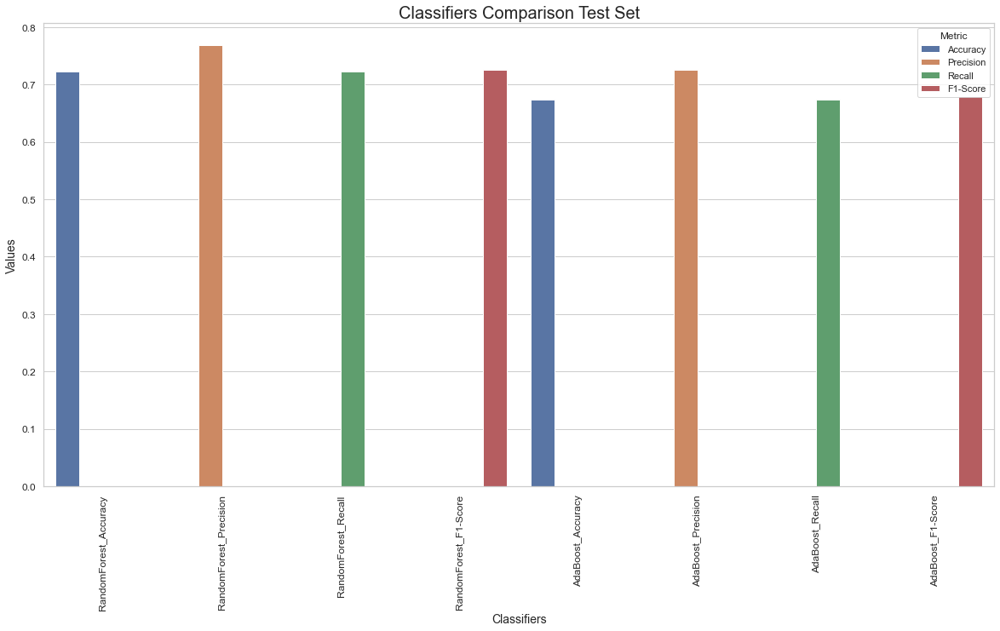

Saving figure ClassifiersComparisonTE


<Figure size 432x288 with 0 Axes>

In [330]:
plt.figure(figsize=(20, 10))
fig = sns.barplot(x='Name', y='Values', data=result, hue='Metric', errwidth=2)
plt.xticks(rotation=90)
plt.ylabel('Values')
plt.xlabel('Classifiers')
plt.title('Classifiers Comparison Test Set', size=20)
plt.show()
save_fig("ClassifiersComparisonTE", False)

Dal plot delle varie metriche sul test set si vede che entrambi i classificatori sono piuttosto performanti: il dubbio è se tali valori elevati sono favoriti dalla presenza del nuovo attributo ("Sentiment_Polarity") o dalla mancanza delle classi più rare (cioè la classe 1 e la classe 2).

Per chiarire questo aspetto vediamo l'importanza delle varie feature.

In [331]:
feature_importances = random_forest_classifier.feature_importances_
columns = train_set.columns.values

In [332]:
importances_df = pd.DataFrame(columns=['column', 'feature_importance'])
i = 0
for name, importance in zip(columns, feature_importances):
    importances_df.loc[i] = [name,importance]
    i = i + 1

In [333]:
importances_df.sort_values(by=['feature_importance'], ascending=False)[:15]

,column,feature_importance
53,Sentiment_Polarity,0.243183
0,Reviews,0.171499
2,Last Updated,0.148960
37,Size_0,0.060049
38,Size_1,0.059114
3,Android Ver,0.034292
48,CR_Everyone,0.034089
40,Size_3,0.028940
18,CAT_GAME,0.015367
39,Size_2,0.015366


Sentiment_Polarity risulta essere la feature più importante, quindi sicuramente ha influito sugli ottimi risultati ottenuti.

Per avere la certezza che l'attributo Sentiment_Polarity sia effettivamente il motivo di tali risultati, procediamo con la classificazione dello stesso dataset escludendo la colonna in questione.

In [334]:
train_set.drop("Sentiment_Polarity", axis=1, inplace=True)
test_set.drop("Sentiment_Polarity", axis=1, inplace=True)

## Random Forest Classifier

In [335]:
random_forest_classifier = RandomForestClassifier(n_estimators=20, random_state=13)

In [336]:
random_forest_classifier.fit(train_set, train_labels)
rf_train_pred = random_forest_classifier.predict(train_set)

Saving figure RFConfusionMatrixAppendixTR


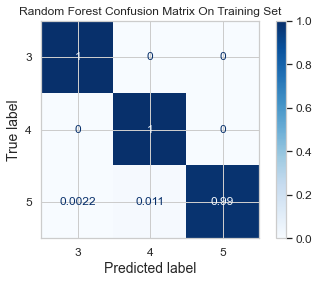

In [337]:
disp = plot_confusion_matrix(random_forest_classifier, train_set, train_labels,
                                 display_labels=[3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')
 
disp.ax_.set_title("Random Forest Confusion Matrix On Training Set")
save_fig("RFConfusionMatrixAppendixTR", False)

In [338]:
print_metrics(train_labels, rf_train_pred)

Accuracy: 0.9956236323851203 

Precision: 0.9956646943546508 

Recall: 0.9956236323851203 

F1-Score: 0.9956194926335259


In [339]:
metrics_train_df.loc['RandomForest_NO_SP'] = get_metrics(train_labels, rf_train_pred)

In [340]:
rf_test_pred = random_forest_classifier.predict(test_set)

Saving figure RFConfusionMatrixAppendixTE


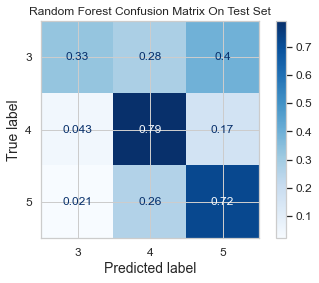

In [341]:
disp = plot_confusion_matrix(random_forest_classifier, test_set, test_labels,
                                 display_labels=[3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')
 
disp.ax_.set_title("Random Forest Confusion Matrix On Test Set")
save_fig("RFConfusionMatrixAppendixTE", False)

In [342]:
print_metrics(test_labels, rf_test_pred)

Accuracy: 0.6114081996434938 

Precision: 0.6635544681544235 

Recall: 0.6114081996434938 

F1-Score: 0.5924126110067447


In [343]:
metrics_test_df.loc['RandomForest_NO_SP'] = get_metrics(test_labels, rf_test_pred)

## Adaboost Classifier

In [344]:
decision_tree_classifier = DecisionTreeClassifier()

In [345]:
adaboost_classifier = AdaBoostClassifier(base_estimator=decision_tree_classifier, n_estimators=100, algorithm="SAMME.R", learning_rate=0.5,random_state=13)

In [346]:
adaboost_classifier.fit(train_set, train_labels)
adaboost_train_pred = adaboost_classifier.predict(train_set)

Text(0.5, 1.0, 'AdaBoost Confusion Matrix On Training Set')

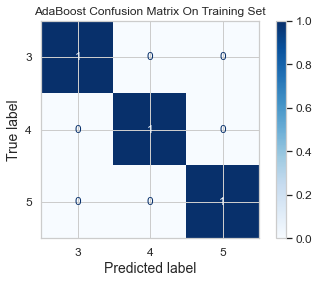

In [347]:
disp = plot_confusion_matrix(adaboost_classifier, train_set, train_labels,
                                 display_labels=[3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')
 
disp.ax_.set_title("AdaBoost Confusion Matrix On Training Set")

In [348]:
print_metrics(train_labels, adaboost_train_pred)

Accuracy: 1.0 

Precision: 1.0 

Recall: 1.0 

F1-Score: 1.0


In [349]:
metrics_train_df.loc['AdaBoost_NO_SP'] = get_metrics(train_labels, adaboost_train_pred)

In [350]:
adaboost_test_pred = adaboost_classifier.predict(test_set)

Saving figure AdaBoostConfusionMatrixTE


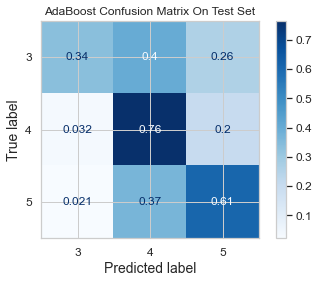

In [351]:
disp = plot_confusion_matrix(adaboost_classifier, test_set, test_labels,
                                 display_labels=[3,4,5],
                                 cmap=plt.cm.Blues,
                                 normalize='true')
 
disp.ax_.set_title("AdaBoost Confusion Matrix On Test Set")
save_fig("AdaBoostConfusionMatrixTE", False)

In [352]:
print_metrics(test_labels, adaboost_test_pred)

Accuracy: 0.5704099821746881 

Precision: 0.6428119058186229 

Recall: 0.5704099821746881 

F1-Score: 0.5585399260069754


In [353]:
metrics_test_df.loc['AdaBoost_NO_SP'] = get_metrics(test_labels, adaboost_test_pred)

### Considerazioni sull'attributo Sentiment_Polarity

Dagli score delle varie metriche, si può notare come le performance dei due classificatore sul training set siano pressocchè identiche ma la presenza dell'attributo Sentiment_Polarity migliora notevolmente le performance sul test set.

Di seguito sono riportati dei grafici che mettono a confronto i risultati ottenuti sul test set.

In [354]:
rfs_df = metrics_test_df.loc[['RandomForest', 'RandomForest_NO_SP']]
adas_df = metrics_test_df.loc[['AdaBoost', 'AdaBoost_NO_SP']]

In [355]:
result_rfs = generate_comparison_dataframe(rfs_df)
result_adas = generate_comparison_dataframe(adas_df)

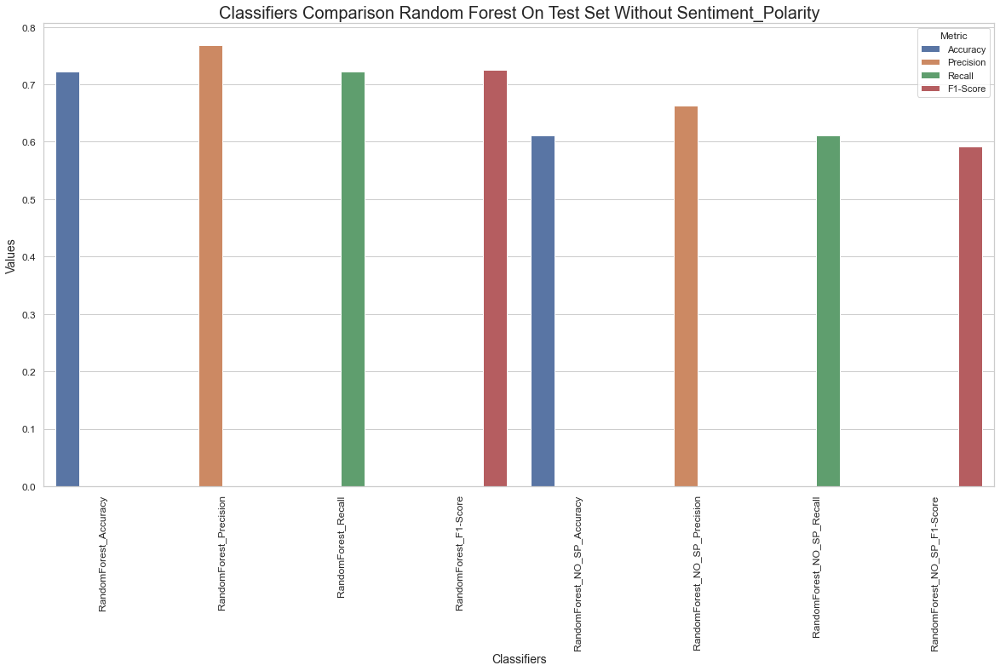

Saving figure ClassifiersComparisonRfTENoSP


<Figure size 432x288 with 0 Axes>

In [356]:
plt.figure(figsize=(20, 10))
fig = sns.barplot(x='Name', y='Values', data=result_rfs, hue='Metric')
plt.xticks(rotation=90)
plt.ylabel('Values')
plt.xlabel('Classifiers')
plt.title('Classifiers Comparison Random Forest On Test Set Without Sentiment_Polarity', size=20)
plt.show()
save_fig("ClassifiersComparisonRfTENoSP", False)

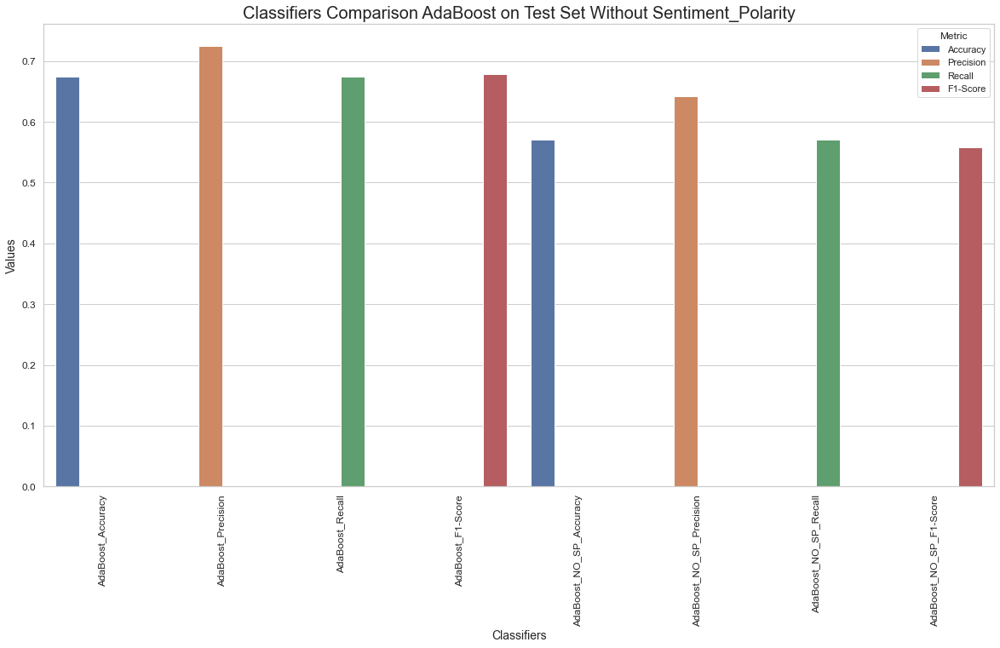

Saving figure ClassifiersComparisonAdasTENoSP


<Figure size 432x288 with 0 Axes>

In [357]:
plt.figure(figsize=(20, 10))
fig = sns.barplot(x='Name', y='Values', data=result_adas, hue='Metric')
plt.xticks(rotation=90)
plt.ylabel('Values')
plt.xlabel('Classifiers')
plt.title('Classifiers Comparison AdaBoost on Test Set Without Sentiment_Polarity', size=20)
plt.show()
save_fig("ClassifiersComparisonAdasTENoSP", False)

In conclusione, l'attributo Sentiment_Polarity risulta avere un ruolo cruciale nell'analisi. Inoltre, sia in presenza che in assenza di tale attributo possiamo vedere come il classificatore Random Forest, andando un pò meno in overfitting rispetto all'AdaBoost, ci fa ottenere risultati migliori sul test set.